# Microbiome analysis for semi-synthetic setup

The notebook reproduces the simulation experiments for the semi-synthetic setup in the paper [__A causal view on compositional data__](https://arxiv.org/abs/2106.11234) by E. Ailer, C. L. Müller and N. Kilbertus.


For the semi-synthetic setup, we first aggregated the microbiome data on a family level. We have 57 datapoints and 47 distinct microbiome families. We estimate relevant parameters from this dataset. Nevertheless, we do not have interventional data available and thus we miss the ground truth. To overcome this, we sample from the estimated parameters and we make a few further assumptions on the confounding term to be able to construct a ground truth. We evaluate the methods on this ground truth.

<div class="alert alert-block alert-info">
<b>Note:</b>    
    
Unfortunately, we personally cannot share the data. We refer to the paper for further references. 
Nevertheless, we can share the parameters we used from our model.
    
</div>

In [2]:
import sys
import os
sys.path.append(os.path.join(os.getcwd(), "../src"))

import logging
import jax
import jax.numpy as np
import numpy as onp
import skbio.stats.composition as cmp
import plotly.express as px
import matplotlib.pyplot as plt
import pandas as pd
import pickle
import statsmodels.api as sm
from datetime import datetime

from simulate_data_fct import sim_IV_negbinomial
from plot_fct import update_layout, update_layout_px, colours, plot_ilr_X_vs_Y
from run_methods_all import run_methods_confidence_interval
from plot_fct import plot_mse_results, plot_beta_results
from run_methods_all import run_methods_all
from method_fct import LinearInstrumentModel

INFO:absl:Starting the local TPU driver.
INFO:absl:Unable to initialize backend 'tpu_driver': Not found: Unable to find driver in registry given worker: local://
INFO:absl:Unable to initialize backend 'gpu': Not found: Could not find registered platform with name: "cuda". Available platform names are: Host Interpreter
INFO:absl:Unable to initialize backend 'tpu': Invalid argument: TpuPlatform is not available.


In [3]:
key = jax.random.PRNGKey(191)

# Parameter estimation and data generation

## Data read in

In [4]:
# load real data on different aggregation levels

data = pd.read_csv(os.path.join(os.getcwd(), "otu_familylevel.csv"), index_col=0)

Yreal = data.iloc[-1, :].values
Xreal_count = data[data.sum(axis=1)!=0].iloc[:-1, :].T.values
n, p = Xreal_count.shape
num_inst = 1  # number of instruments, here only 1
Xreal = np.array([Xreal_count[i, :]/Xreal_count[i, :].sum() for i in range(n)])
Zreal = np.array([data.columns.values[i].find("control") for i in range(n)])*(-1)

In [5]:
Xreal_n0 = LinearInstrumentModel.add_term_to_zeros(Xreal)
Xreal_ilr = cmp.ilr(Xreal_n0)
# Compute F-Statistics 
ZZreal = onp.array(sm.add_constant(Zreal))
alphahat = np.linalg.inv(ZZreal.T@ZZreal)@ZZreal.T@Xreal_ilr
MSM = np.sum(((ZZreal@alphahat - np.mean(Xreal_ilr, axis=0))**2), axis=0)/(num_inst)
MSE = np.sum(((ZZreal@alphahat - Xreal_ilr)**2), axis=0)/(n-num_inst)
F = MSM / MSE
np.round(F,2)

DeviceArray([0.03, 0.  , 0.91, 0.37, 0.  , 0.31, 0.36, 0.55, 0.53, 0.03,
             0.33, 0.01, 2.49, 0.09, 0.03, 1.61, 1.5 , 0.07, 0.06, 0.01,
             0.24, 2.44, 0.  , 0.26, 0.41, 0.74, 0.02, 0.73, 1.33, 0.04,
             0.16, 0.08, 3.56, 1.12, 0.83, 0.52, 0.01, 1.4 , 0.68, 0.88,
             0.86, 7.97, 0.03, 0.11, 0.31, 0.4 ], dtype=float32)

## Data Visualization

In [6]:
X_plot = np.hstack([Xreal[:, Xreal.mean(axis=0)>0.03], Xreal[:, Xreal.mean(axis=0)<0.03].sum(axis=1).T[..., np.newaxis]])
fig = px.bar(pd.DataFrame(X_plot[:100, :], columns=["Microbe "+str(i) for i in range(X_plot.shape[1]-1)] + ["Other"]))
fig = update_layout_px(fig)
fig.update_xaxes(title="Sample number")
fig.update_yaxes(title="Percentage of microbiota in sample")
fig.show()

In [7]:
Xreal_ilr = cmp.ilr(Xreal_n0)

In [8]:
fig = plot_ilr_X_vs_Y(Xreal_ilr, Xreal_ilr, Yreal, Yreal)

fig.update_layout(xaxis3=dict(showline=True, linewidth=2, linecolor="black"))
fig.update_layout(yaxis3=dict(showline=True, linewidth=2, linecolor="black"))
fig.update_layout(xaxis4=dict(showline=True, linewidth=2, linecolor="black"))
fig.update_layout(yaxis4=dict(showline=True, linewidth=2, linecolor="black"))
fig.update_layout(xaxis5=dict(showline=True, linewidth=2, linecolor="black"))
fig.update_layout(yaxis5=dict(showline=True, linewidth=2, linecolor="black"))
fig.update_layout(width=2000, height=500)
fig.show()

## Parameter estimation

We estimate the $\alpha$ parameter and the zero inflation parameter in the next cell. For the $\alpha$ value we exploit the binary nature of $Z$. For the zero inflation parameter we apply a very simplistic frequency count. 

Please note, that there are much more elaborate models on the estimation procedure. We argue, that the focus here is to find a sensible parameter setting instead of concentrating on getting insights on the particular dataset.


In [9]:
# FIRST STAGE ESTIMATION
nreal, preal = Xreal.shape

x0, x1 = Xreal_count[Zreal==0], Xreal_count[Zreal==1]
alpha0_hat = x0.mean(axis=0)
alphaT_hat = x1.mean(axis=0) - alpha0_hat

ps_hat = (Xreal_count==0).sum(axis=0) / n

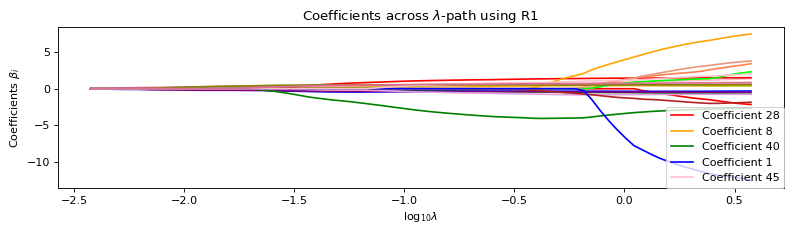

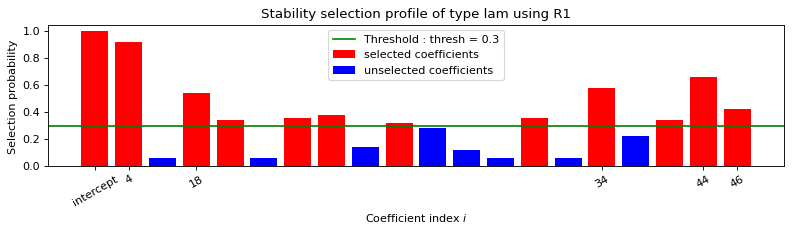

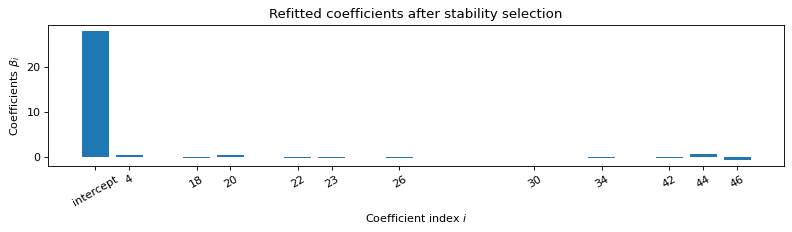


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.018s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    18    20    22    23    26    30    34    42    44    46    
   Running time :  0.09s

[27.826  0.     0.     0.     0.     0.393  0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.     0.    -0.257
  0.     0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.
  0.     0.113  0.     0.     0.    -0.252  0.     0.     0.     0.
  0.     0.     0.    -0.255  0.     0.7    0.    -0.533]
6.214842


In [10]:
# SECOND STAGE ESTIMATION
from method_fct import LinearInstrumentModel, noregression_logcontrast

Xreal_n0 = LinearInstrumentModel.add_term_to_zeros(Xreal)
Xreal_ilr = cmp.ilr(Xreal_n0)
betahat, Yhat = noregression_logcontrast(ZZreal, Xreal, Yreal, Xreal_n0, logcontrast_threshold=0.3)
print(betahat)
print(np.mean((Yhat-Yreal)**2))

# Data generation from real parameters



In the following section we will sample from the specific parameter setting. 

We also make additional assumptions on the confounding composition $\mu_c$, the confounder influence on $Y$ called $c_Y$ and the dispersion parameter $c_X$ of the negative binomial distribution.

In [11]:
from parameter_settings import return_parameter_setting, simulate_data
from types import SimpleNamespace

In [12]:
# set options for data generation
strDim = "p47"
strRel = "negbinom"
strInst = "unknown"

# get parameter setting which is used in the paper
dictReturn = return_parameter_setting(strDim, strRel, strInst,
                                     alpha0_hat, alphaT_hat, ps_hat, betahat)

# generate namespace for parameters
param = SimpleNamespace(**dictReturn)

# print the parameter setting
print(strDim, strRel, strInst)
param

p47 negbinom unknown


namespace(strDim='p47',
          strRel='negbinom',
          strInst='unknown',
          n=1000,
          p=47,
          num_inst=1,
          c_X=0.2,
          alpha0=array([6.22727273e+00, 4.54545455e-02, 9.09090909e-02, 0.00000000e+00,
                        1.44136364e+02, 1.36363636e-01, 4.54545455e-02, 0.00000000e+00,
                        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
                        0.00000000e+00, 9.09090909e-02, 8.18181818e-01, 8.36363636e+00,
                        9.09090909e-02, 6.27272727e+00, 2.86363636e+01, 0.00000000e+00,
                        6.02727273e+01, 1.22727273e+00, 1.19363182e+04, 1.94090909e+02,
                        1.36363636e-01, 3.66818182e+01, 1.63181818e+01, 2.76818182e+01,
                        9.04545455e+00, 8.86136364e+02, 2.88818182e+02, 5.68181818e+00,
                        1.42772727e+03, 0.00000000e+00, 5.66363636e+01, 9.28727273e+02,
                        0.00000000e+00, 9.09090909e

In [13]:
confounder, Z_sim, X_sim, Y_sim, X_star, Y_star = simulate_data(dictReturn)

X_sim_ilr = cmp.ilr(X_sim)
X_star_ilr = cmp.ilr(X_star)

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



In [14]:
X_plot = np.hstack([X_sim[:, X_sim.mean(axis=0)>0.03], X_sim[:, X_sim.mean(axis=0)<0.03].sum(axis=1).T[..., np.newaxis]])
fig = px.bar(pd.DataFrame(X_plot[:100, :], columns=["Microbe "+str(i) for i in range(X_plot.shape[1]-1)] + ["Other"]))
fig = update_layout_px(fig)
fig.update_xaxes(title="Sample number")
fig.update_yaxes(title="Percentage of microbiota in sample")
fig.show()

In [15]:
# Compute F-Statistics 
ZZ_sim = onp.array(sm.add_constant(Z_sim))
alphahat = np.linalg.inv(ZZ_sim.T@ZZ_sim)@ZZ_sim.T@X_sim_ilr
MSM = np.sum(((ZZ_sim@alphahat - np.mean(X_sim_ilr, axis=0))**2), axis=0)/(num_inst)
MSE = np.sum(((ZZ_sim@alphahat - X_sim_ilr)**2), axis=0)/(n-num_inst)
F = MSM / MSE
F

DeviceArray([5.9348745e-03, 3.6268795e+01, 2.8816397e+01, 3.5993192e-01,
             3.5993209e-01, 3.5993195e-01, 3.5993198e-01, 3.5993204e-01,
             3.5993207e-01, 3.5993201e-01, 3.5993192e-01, 3.5993204e-01,
             3.5993201e-01, 3.5993201e-01, 3.5993201e-01, 3.5993198e-01,
             3.5993198e-01, 3.5993201e-01, 3.5993198e-01, 3.5993201e-01,
             3.5993201e-01, 5.6555824e+01, 3.6267974e+00, 2.0080053e+01,
             2.0080048e+01, 2.0080050e+01, 2.0080046e+01, 2.0080051e+01,
             1.6537529e+01, 7.0971000e-01, 1.8592365e+01, 2.6910596e+00,
             1.2802291e+01, 1.2802299e+01, 3.0858541e+00, 7.4964261e+00,
             7.4964256e+00, 7.4964252e+00, 7.4964271e+00, 7.4964242e+00,
             7.4964242e+00, 7.4964247e+00, 7.4964218e+00, 8.9438565e-02,
             6.0128150e+00, 1.5301811e+02], dtype=float32)

In [16]:
fig = plot_ilr_X_vs_Y(X_sim_ilr, X_star_ilr, Y_sim, Y_star)

fig.update_layout(xaxis3=dict(showline=True, linewidth=2, linecolor="black"))
fig.update_layout(yaxis3=dict(showline=True, linewidth=2, linecolor="black"))
fig.update_layout(xaxis4=dict(showline=True, linewidth=2, linecolor="black"))
fig.update_layout(yaxis4=dict(showline=True, linewidth=2, linecolor="black"))
fig.update_layout(xaxis5=dict(showline=True, linewidth=2, linecolor="black"))
fig.update_layout(yaxis5=dict(showline=True, linewidth=2, linecolor="black"))
fig.update_layout(width=2000, height=500)
fig.show()

**************************************************************************************************
*****************************************We are at 0 of 20***********************************************
**************************************************************************************************
---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.   -0.35  0.07  0.06  0.05  0.05  0.04  0.04  0.03  0.03
  0.03  0.03  0.03  0.02  0.02  0.02  0.02  0.02  0.02  0.09  0.15  0.01
  0.01  0.0

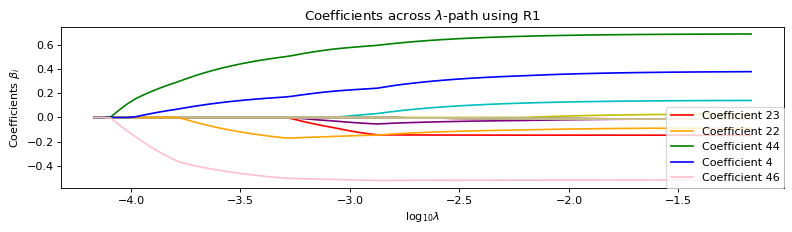

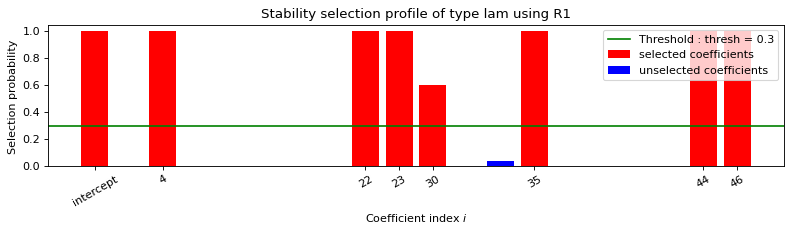

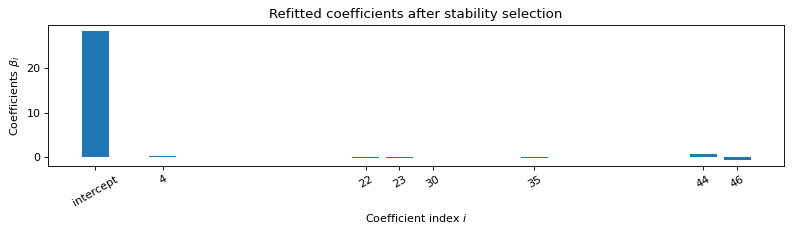


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.004s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    30    35    44    46    
   Running time :  0.085s

True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.    0.    0.28  0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.   -0.12 -0.25
  0.    0.    0.    0.    0.    0.    0.08  0.    0.    0.    0.   -0.1
  0.    0.    0.    0.    0.    0.    0.    0.    0.65  0.   -0.54]
Error: 0.17

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet

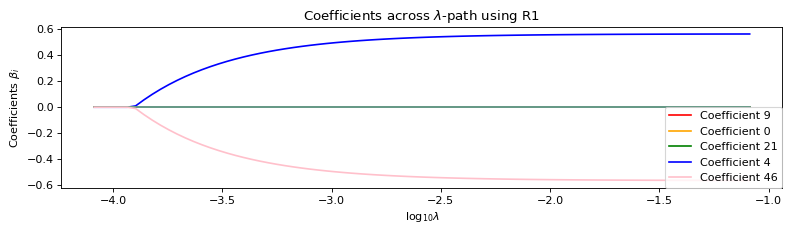

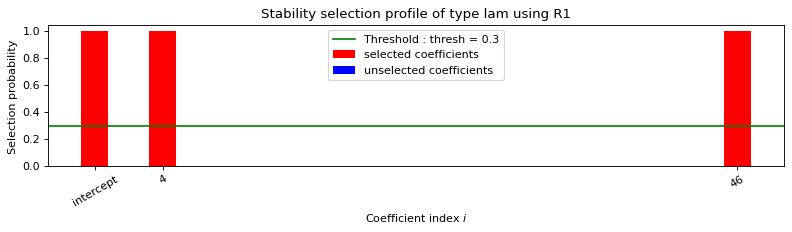

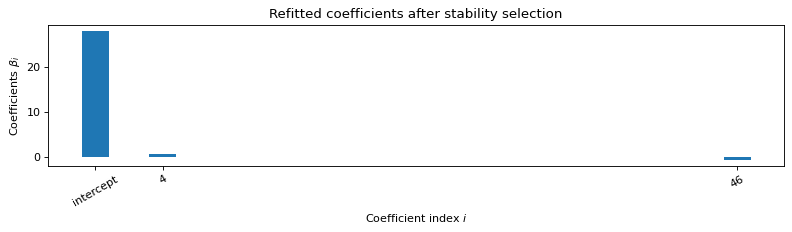


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.055s

True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.    0.    0.57  0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.   -0.57]
Error: 4.35

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>

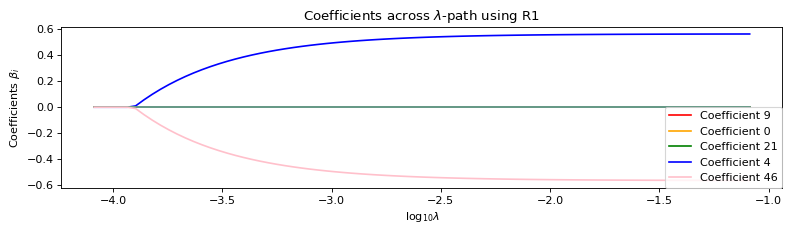

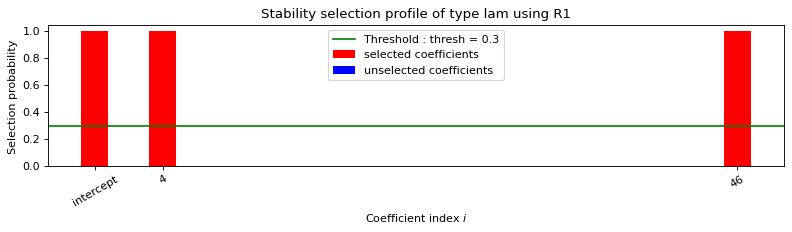

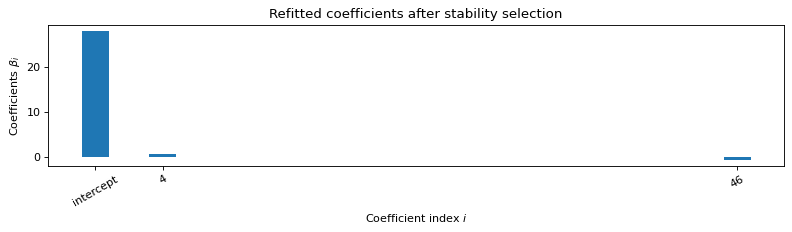


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.052s

True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.   -0.51  0.1   0.09  0.08  0.07  0.06  0.05  0.05  0.05
  0.04  0.04  0.04  0.03  0.03  0.03  0.03  0.03  0.03  0.03  0.02  0.02
  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02
  0.02  0.01  0.01  0.01  0.01  0.01  0.01  0.01  0.01  0.57]
Error: 4.35

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>

INFO:absl:Setup matrices...
INFO:absl:Optimize lambda...
INFO:absl:KIV1 minimization did not succeed.
INFO:absl:Optimal lambda [-10.06804258]...
INFO:absl:Optimize xi...
INFO:absl:KIV2 minimization did not succeed.
INFO:absl:Optimal xi [-2.99573227]...
INFO:absl:Predict treatment effect...


Error: 6.16

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY SECOND STAGE - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 0.03

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV (manual) >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 8.45

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR ILR Regression Implementation >>>>>>>>>>>>>>>>>>>>>>>


/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/regression/linear_model.py:1817: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                 -174942.292
Model:                         IV2SLS   Adj. R-squared:            -183386.565
Method:                     Two Stage   F-statistic:                -2.354e-16
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Di, 03 Aug 2021                                         
Time:                        05:40:41                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         49.3911        nan        nan        n

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.   -0.35  0.07  0.06  0.05  0.05  0.04  0.04  0.03  0.03
  0.03  0.03  0.03  0.02  0.02  0.02  0.02  0.02  0.02  0.1   0.13  0.01
  0.01  0.01  0.01  0.01 -0.03 -0.13  0.01 -0.04  0.01  0.01  0.02  0.01
  0.01  0.01  0.01  0.01  0.01  0.01  0.01 -0.69  0.02  0.54]
Estimated Beta: [-0.01 -0.01 -0.01 -0.01  0.38 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.09 -0.13
 -0.01 -0.01 -0.01

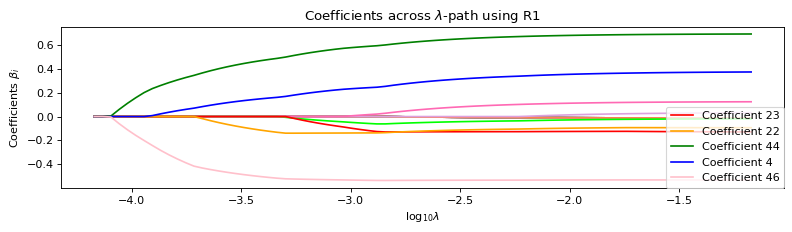

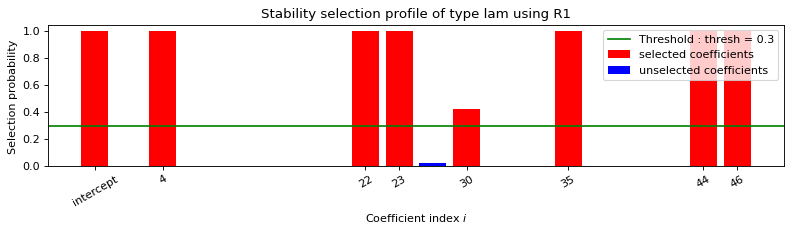

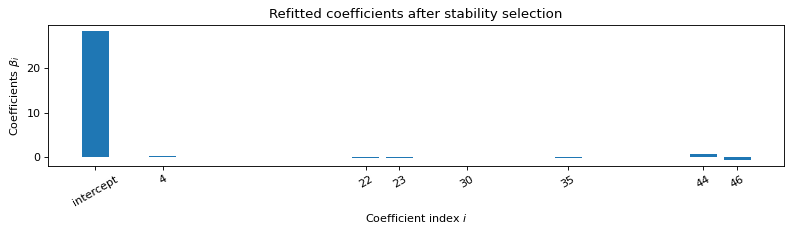


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.004s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    30    35    44    46    
   Running time :  0.084s

True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.    0.    0.29  0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.   -0.13 -0.22
  0.    0.    0.    0.    0.    0.    0.07  0.    0.    0.    0.   -0.1
  0.    0.    0.    0.    0.    0.    0.    0.    0.64  0.   -0.54]
Error: 0.18

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet

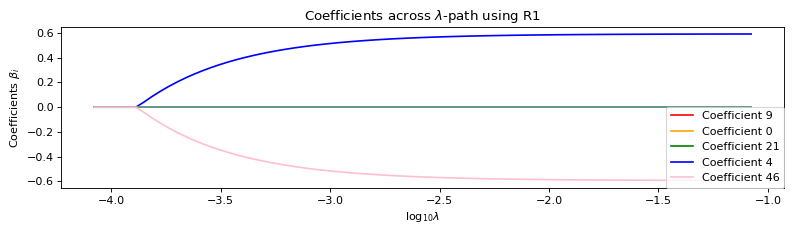

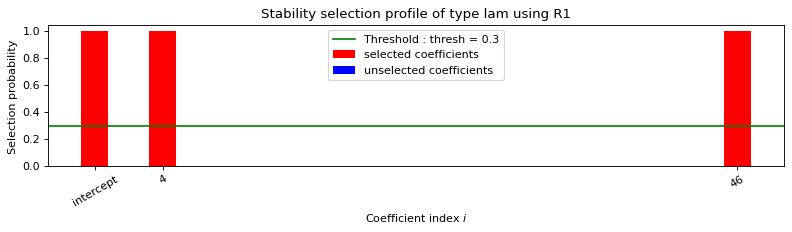

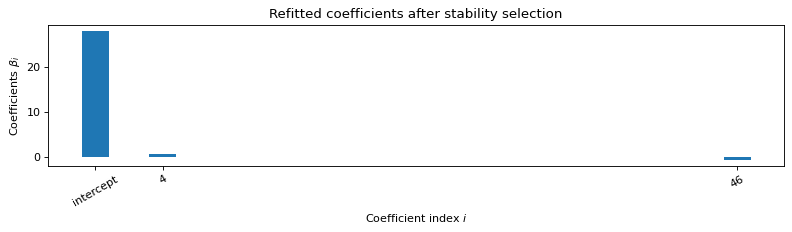


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.002s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.056s

True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.    0.    0.59  0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.   -0.59]
Error: 4.42

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>

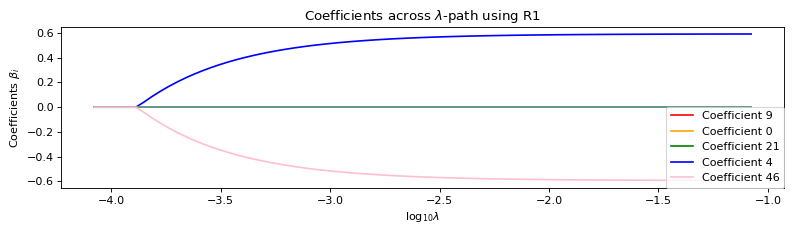

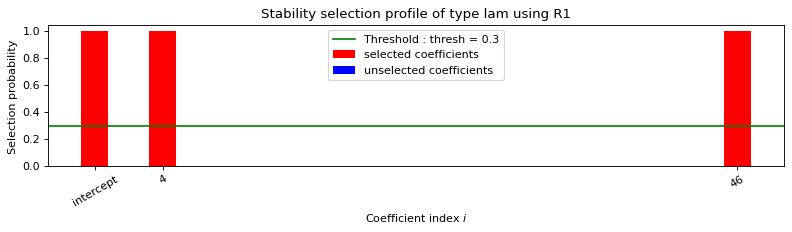

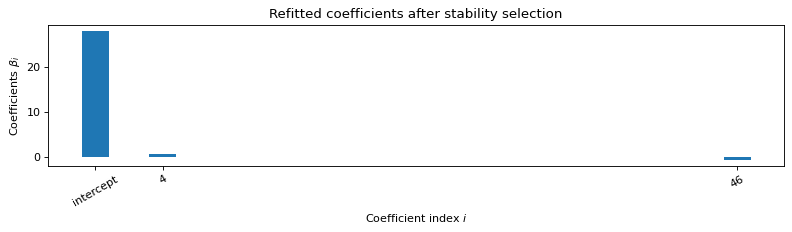

INFO:absl:Setup matrices...



 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.054s

True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.   -0.53  0.11  0.09  0.08  0.07  0.06  0.06  0.05  0.05
  0.04  0.04  0.04  0.04  0.03  0.03  0.03  0.03  0.03  0.03  0.03  0.02
  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02
  0.02  0.02  0.02  0.01  0.01  0.01  0.01  0.01  0.01  0.6 ]
Error: 4.42

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>

INFO:absl:Optimize lambda...
INFO:absl:KIV1 minimization did not succeed.
INFO:absl:Optimal lambda [-10.0468778]...
INFO:absl:Optimize xi...
INFO:absl:KIV2 minimization did not succeed.
INFO:absl:Optimal xi [-2.99573227]...
INFO:absl:Predict treatment effect...


Error: 7.31

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY SECOND STAGE - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 0.03

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV (manual) >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 7.93

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR ILR Regression Implementation >>>>>>>>>>>>>>>>>>>>>>>


/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/regression/linear_model.py:1817: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                 -150869.875
Model:                         IV2SLS   Adj. R-squared:            -158152.205
Method:                     Two Stage   F-statistic:                -4.090e-16
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Di, 03 Aug 2021                                         
Time:                        05:43:02                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         71.7529        nan        nan        n

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.   -0.35  0.07  0.06  0.05  0.05  0.04  0.04  0.03  0.03
  0.03  0.03  0.03  0.02  0.02  0.02  0.02  0.02  0.02  0.09  0.13  0.01
  0.01  0.01  0.01  0.01 -0.05 -0.13  0.01 -0.04  0.01  0.01  0.    0.01
  0.01  0.01  0.01  0.01  0.01  0.01  0.01 -0.7   0.03  0.54]
Estimated Beta: [-0.01 -0.01 -0.01 -0.01  0.38 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.09 -0.14
 -0.01 -0.01 -0.01

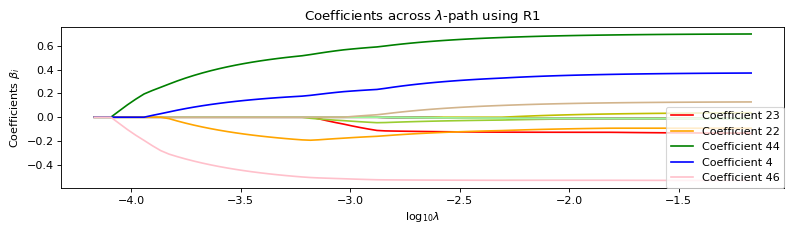

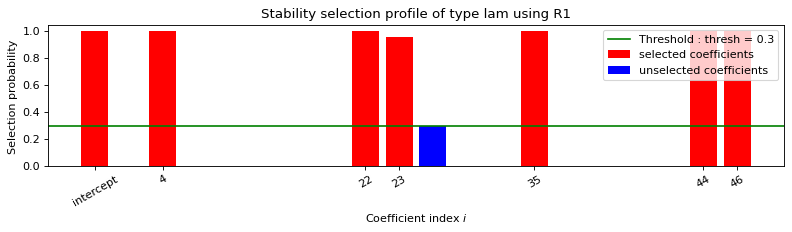

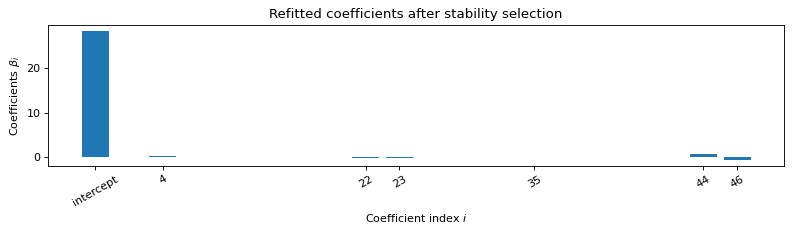


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.004s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    35    44    46    
   Running time :  0.079s

True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.    0.    0.29  0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.   -0.13 -0.21
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.   -0.08
  0.    0.    0.    0.    0.    0.    0.    0.    0.66  0.   -0.54]
Error: 0.19

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Lo

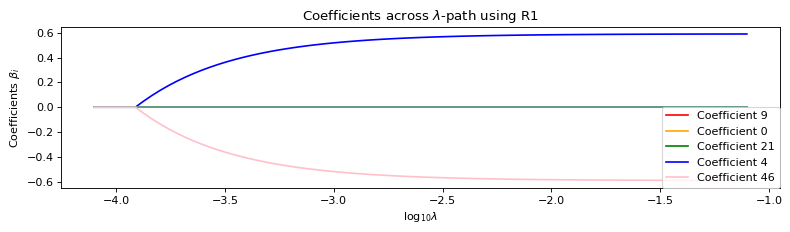

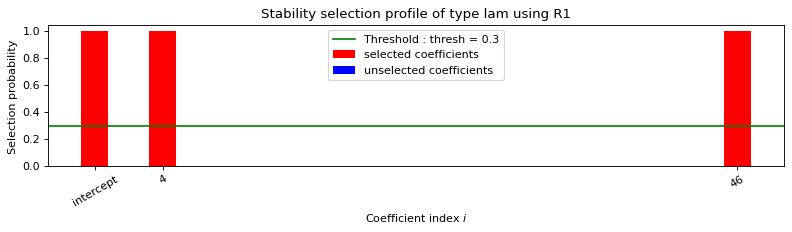

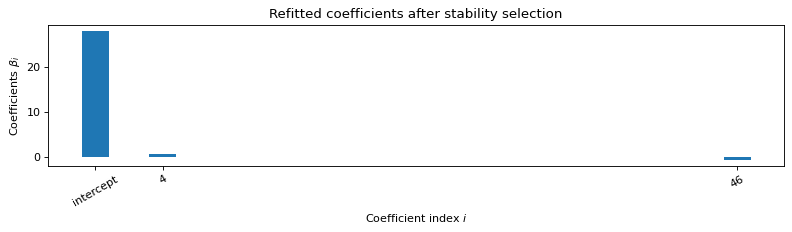


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.002s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.051s

True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.    0.    0.59  0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.   -0.59]
Error: 4.77

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>

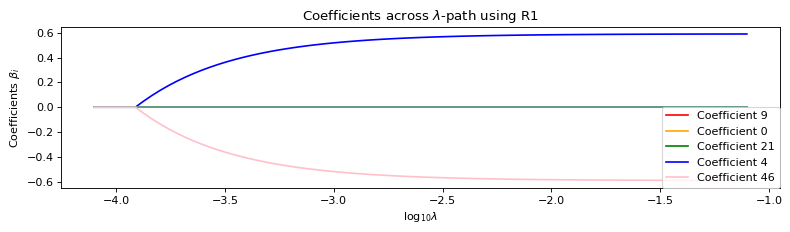

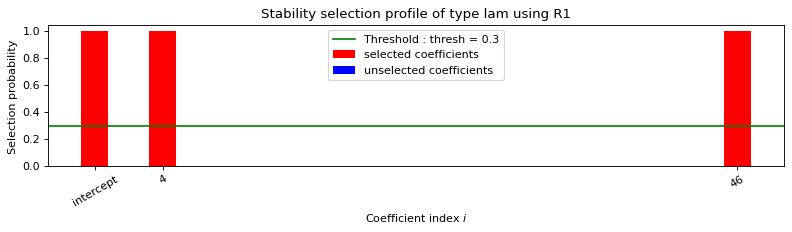

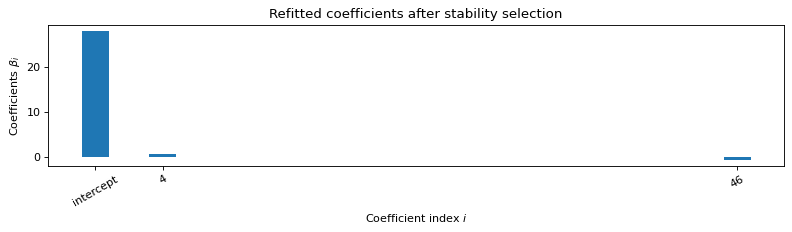

INFO:absl:Setup matrices...



 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.002s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.05s

True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.   -0.53  0.11  0.09  0.08  0.07  0.06  0.06  0.05  0.05
  0.04  0.04  0.04  0.04  0.03  0.03  0.03  0.03  0.03  0.03  0.03  0.02
  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02
  0.02  0.02  0.01  0.01  0.01  0.01  0.01  0.01  0.01  0.6 ]
Error: 4.77

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>

INFO:absl:Optimize lambda...
INFO:absl:KIV1 minimization did not succeed.
INFO:absl:Optimal lambda [-10.84069905]...
INFO:absl:Optimize xi...
INFO:absl:KIV2 minimization did not succeed.
INFO:absl:Optimal xi [-2.99573283]...
INFO:absl:Predict treatment effect...


Error: 7.41

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY SECOND STAGE - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 0.03

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV (manual) >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 8.73

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR ILR Regression Implementation >>>>>>>>>>>>>>>>>>>>>>>


/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/regression/linear_model.py:1817: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                -2181795.415
Model:                         IV2SLS   Adj. R-squared:           -2287107.729
Method:                     Two Stage   F-statistic:                 1.023e-16
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Di, 03 Aug 2021                                         
Time:                        05:45:24                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        194.7466        nan        nan        n

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.   -0.34  0.07  0.06  0.05  0.04  0.04  0.04  0.03  0.03
  0.03  0.03  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.1   0.14  0.01
  0.01  0.01  0.01  0.01 -0.03 -0.13  0.01 -0.03  0.01  0.01  0.01  0.01
  0.01  0.01  0.01  0.01  0.01  0.01  0.01 -0.7   0.02  0.54]
Estimated Beta: [-0.01 -0.01 -0.01 -0.01  0.37 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.1  -0.14
 -0.01 -0.01 -0.01

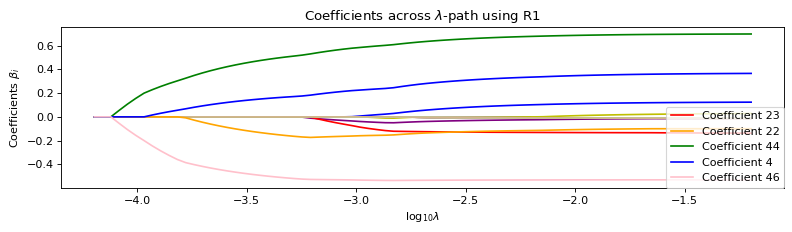

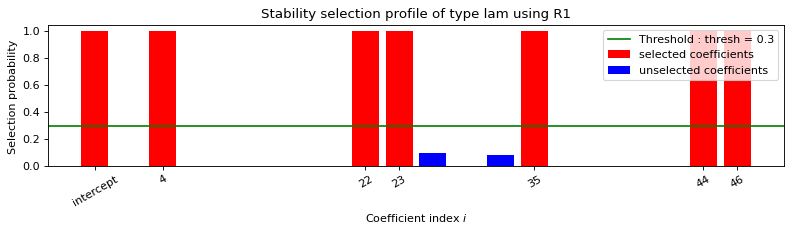

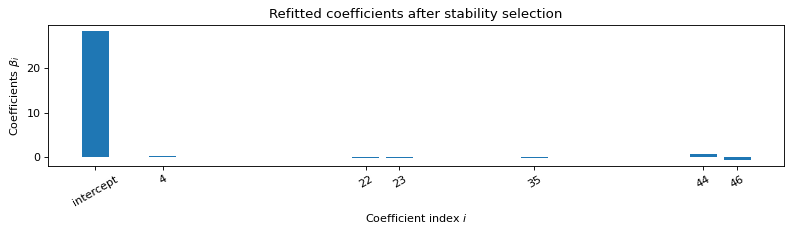


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.005s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    35    44    46    
   Running time :  0.078s

True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.    0.    0.29  0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.   -0.14 -0.2
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.   -0.08
  0.    0.    0.    0.    0.    0.    0.    0.    0.67  0.   -0.54]
Error: 0.18

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log

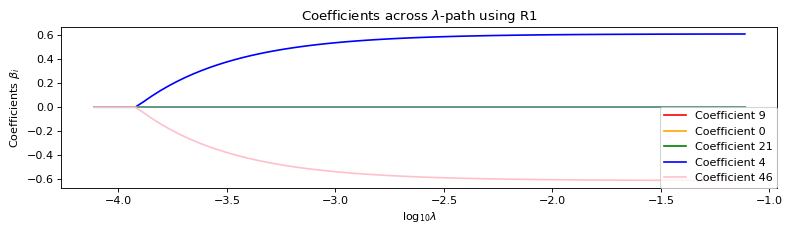

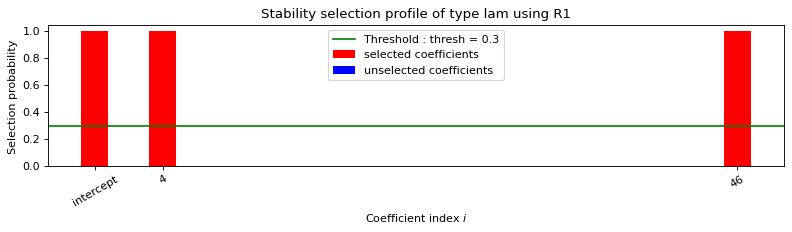

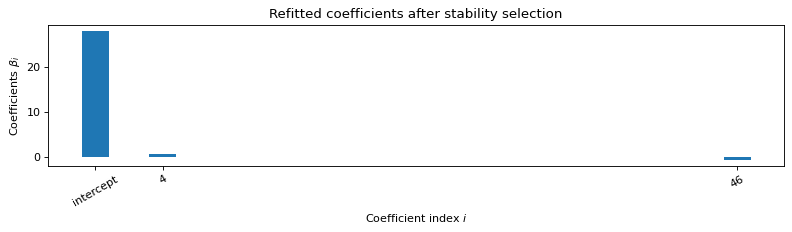


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.002s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.051s

True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.    0.    0.61  0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.   -0.61]
Error: 5.09

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>

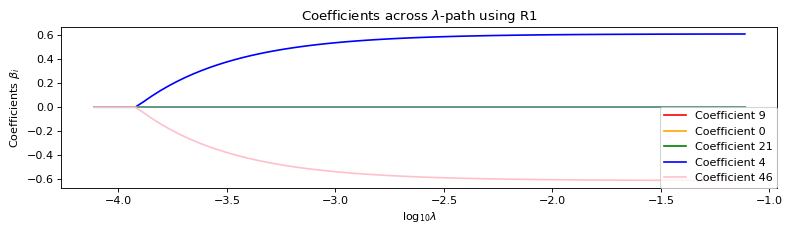

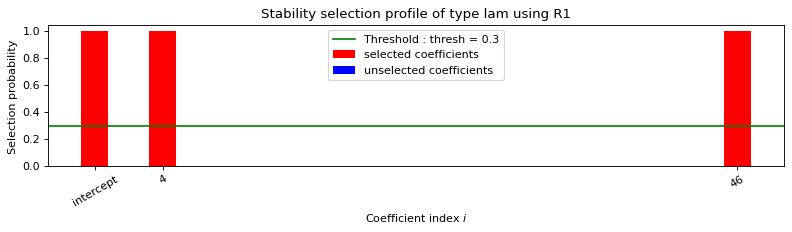

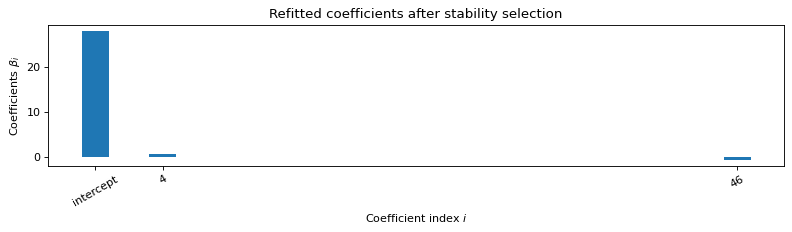

INFO:absl:Setup matrices...



 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.002s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.055s

True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.   -0.55  0.11  0.09  0.08  0.07  0.06  0.06  0.05  0.05
  0.05  0.04  0.04  0.04  0.04  0.03  0.03  0.03  0.03  0.03  0.03  0.03
  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02
  0.02  0.02  0.02  0.02  0.01  0.01  0.01  0.01  0.01  0.62]
Error: 5.09

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>

INFO:absl:Optimize lambda...
INFO:absl:KIV1 minimization did not succeed.
INFO:absl:Optimal lambda [-10.79644072]...
INFO:absl:Optimize xi...
INFO:absl:KIV2 minimization did not succeed.
INFO:absl:Optimal xi [-2.9956856]...
INFO:absl:Predict treatment effect...


Error: 6.19

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY SECOND STAGE - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 0.03

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV (manual) >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 9.48

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR ILR Regression Implementation >>>>>>>>>>>>>>>>>>>>>>>


/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/regression/linear_model.py:1817: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                 -181429.454
Model:                         IV2SLS   Adj. R-squared:            -190186.853
Method:                     Two Stage   F-statistic:                -4.191e-16
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Di, 03 Aug 2021                                         
Time:                        05:47:46                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -24.1496   7.95e+09  -3.04e-09      1.0

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.   -0.35  0.07  0.06  0.05  0.05  0.04  0.04  0.03  0.03
  0.03  0.03  0.03  0.02  0.02  0.02  0.02  0.02  0.02  0.1   0.12  0.01
  0.01  0.01  0.01  0.01 -0.04 -0.15  0.01 -0.03  0.01  0.01  0.    0.01
  0.01  0.01  0.01  0.01  0.01  0.01  0.01 -0.68  0.03  0.53]
Estimated Beta: [-0.01 -0.01 -0.01 -0.01  0.38 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.1  -0.12
 -0.01 -0.01 -0.01

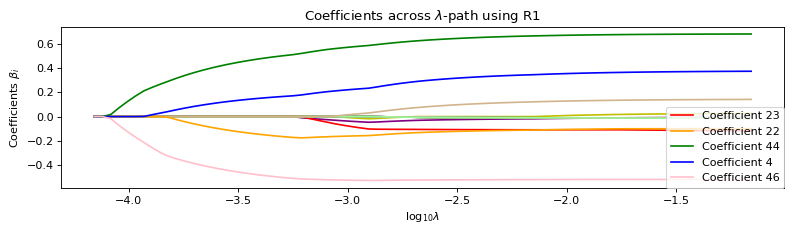

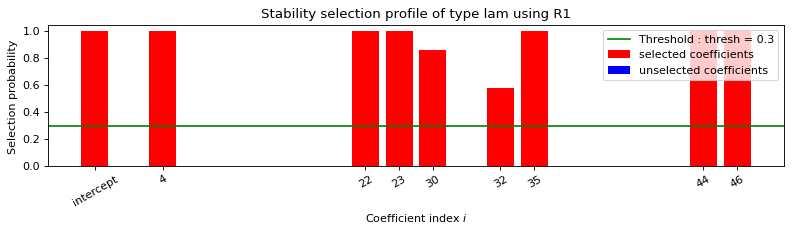

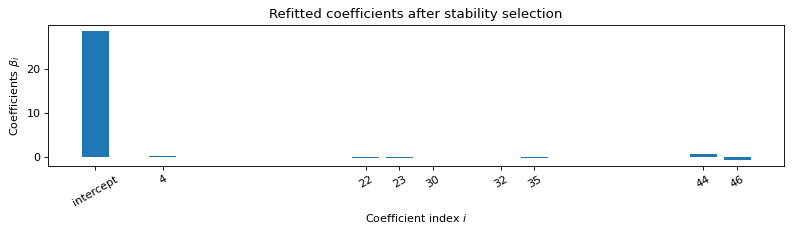


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.004s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    30    32    35    44    46    
   Running time :  0.083s

True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.    0.    0.29  0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.   -0.14 -0.2
  0.    0.    0.    0.    0.    0.    0.09  0.   -0.06  0.    0.   -0.09
  0.    0.    0.    0.    0.    0.    0.    0.    0.65  0.   -0.54]
Error: 0.13

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dir

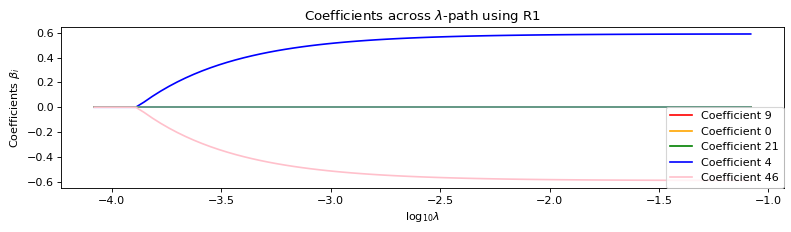

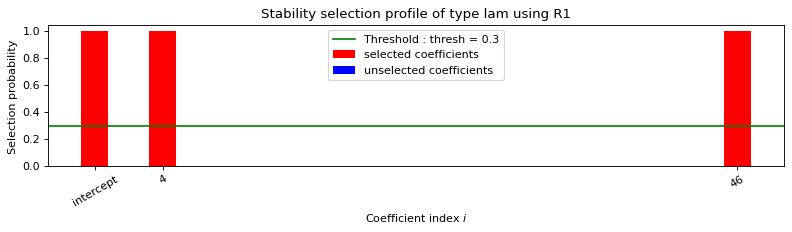

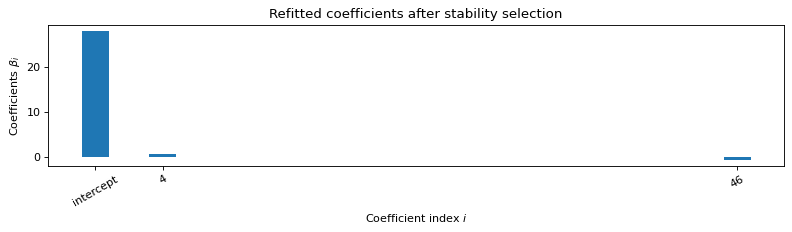


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.002s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.056s

True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.    0.    0.59  0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.   -0.59]
Error: 4.61

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>

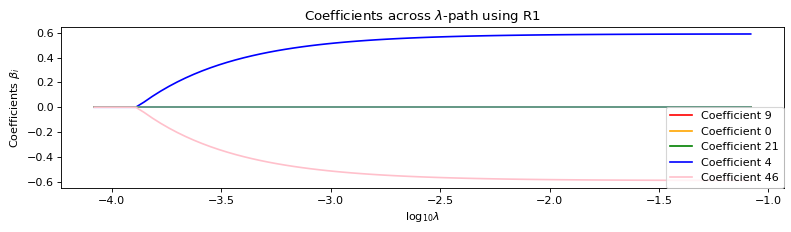

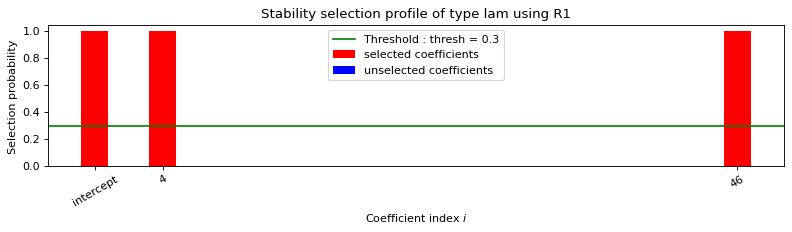

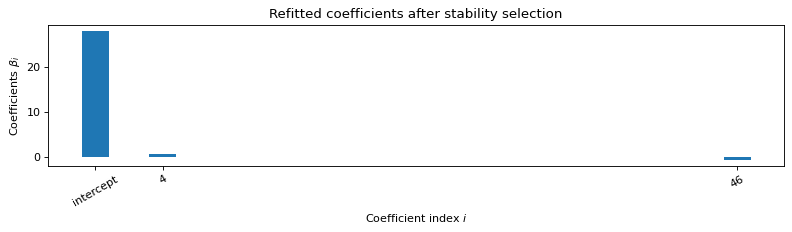

INFO:absl:Setup matrices...



 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.002s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.052s

True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.   -0.53  0.11  0.09  0.08  0.07  0.06  0.06  0.05  0.05
  0.04  0.04  0.04  0.04  0.03  0.03  0.03  0.03  0.03  0.03  0.03  0.02
  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02
  0.02  0.02  0.01  0.01  0.01  0.01  0.01  0.01  0.01  0.6 ]
Error: 4.61

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>

INFO:absl:Optimize lambda...
INFO:absl:KIV1 minimization did not succeed.
INFO:absl:Optimal lambda [-10.02797879]...
INFO:absl:Optimize xi...
INFO:absl:KIV2 minimization did not succeed.
INFO:absl:Optimal xi [-2.99568961]...
INFO:absl:Predict treatment effect...


Error: 6.65

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY SECOND STAGE - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 0.03

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV (manual) >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 8.58

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR ILR Regression Implementation >>>>>>>>>>>>>>>>>>>>>>>


/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/regression/linear_model.py:1817: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                  -77896.427
Model:                         IV2SLS   Adj. R-squared:             -81656.428
Method:                     Two Stage   F-statistic:                 1.475e-16
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Di, 03 Aug 2021                                         
Time:                        05:50:11                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -13.6780        nan        nan        n

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.   -0.34  0.07  0.06  0.05  0.04  0.04  0.04  0.03  0.03
  0.03  0.03  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.11  0.13  0.01
  0.01  0.01  0.01  0.01 -0.07 -0.15  0.01 -0.04  0.01  0.01 -0.01  0.01
  0.01  0.01  0.01  0.01  0.01  0.01  0.01 -0.69  0.03  0.53]
Estimated Beta: [-0.01 -0.01 -0.01 -0.01  0.36 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.11 -0.14
 -0.01 -0.01 -0.01

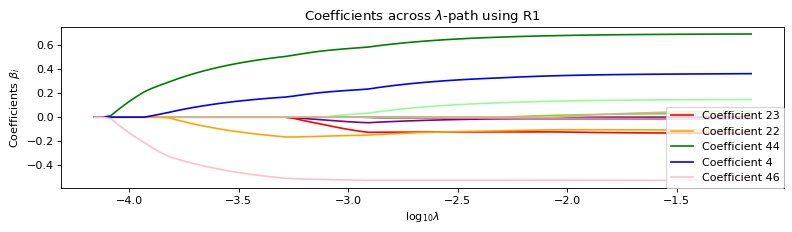

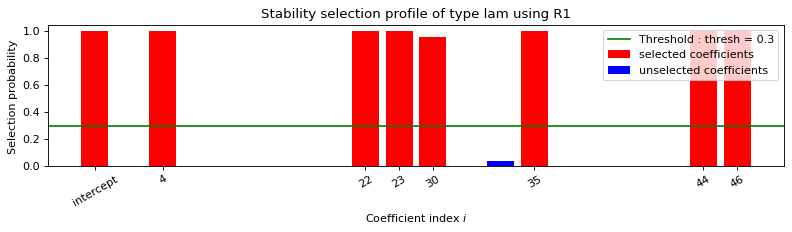

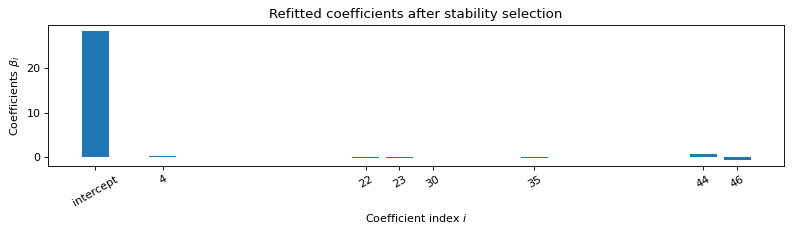


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.005s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    30    35    44    46    
   Running time :  0.086s

True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.    0.    0.28  0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.   -0.13 -0.24
  0.    0.    0.    0.    0.    0.    0.08  0.    0.    0.    0.   -0.09
  0.    0.    0.    0.    0.    0.    0.    0.    0.63  0.   -0.54]
Error: 0.21

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichle

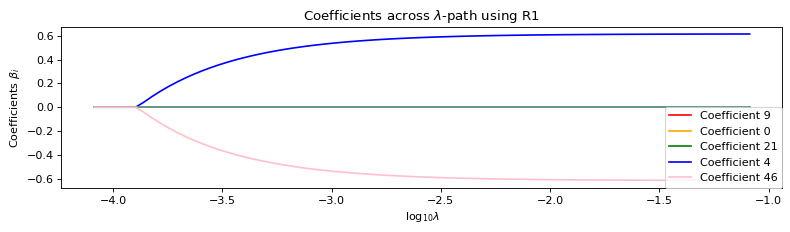

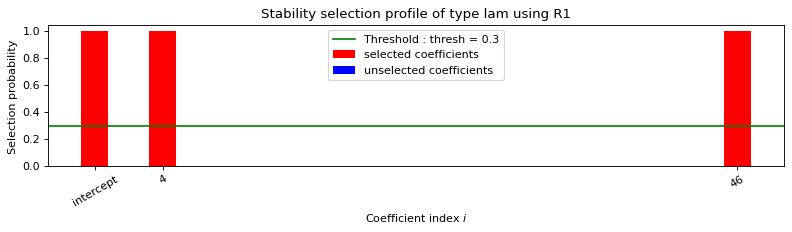

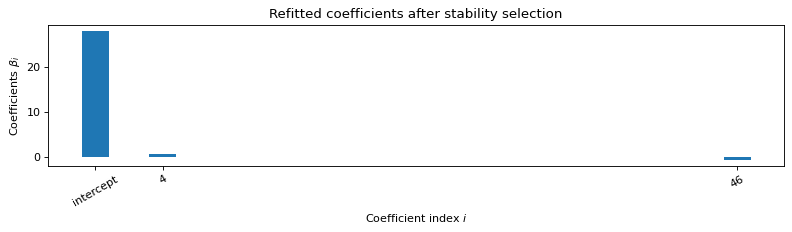


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.002s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.051s

True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.    0.    0.62  0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.   -0.62]
Error: 5.2

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>

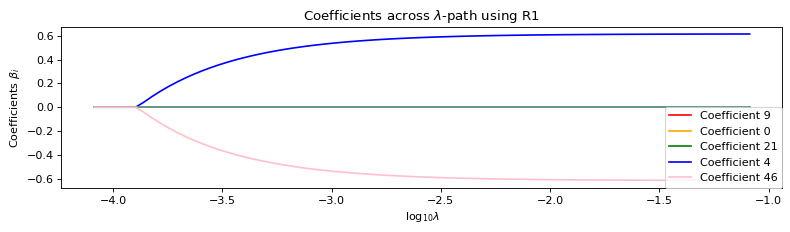

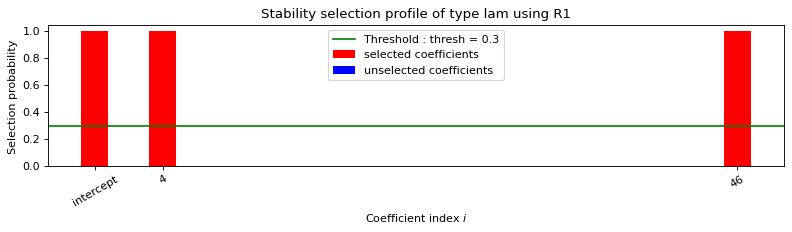

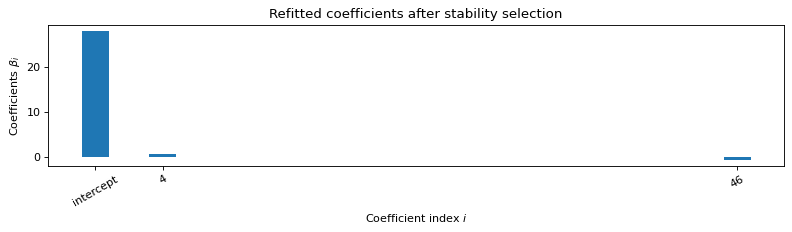

INFO:absl:Setup matrices...



 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.054s

True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.   -0.55  0.11  0.1   0.08  0.07  0.06  0.06  0.05  0.05
  0.05  0.04  0.04  0.04  0.04  0.03  0.03  0.03  0.03  0.03  0.03  0.03
  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02
  0.02  0.02  0.02  0.02  0.01  0.01  0.01  0.01  0.01  0.62]
Error: 5.2

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>

INFO:absl:Optimize lambda...
INFO:absl:Optimal lambda [-2.47289434]...
INFO:absl:Optimize xi...
INFO:absl:KIV2 minimization did not succeed.
INFO:absl:Optimal xi [-2.9957154]...
INFO:absl:Predict treatment effect...


Error: 6.73

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY SECOND STAGE - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 0.04

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV (manual) >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 9.22

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR ILR Regression Implementation >>>>>>>>>>>>>>>>>>>>>>>


/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/regression/linear_model.py:1817: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                -3157200.905
Model:                         IV2SLS   Adj. R-squared:           -3309594.701
Method:                     Two Stage   F-statistic:                -1.683e-14
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Di, 03 Aug 2021                                         
Time:                        05:52:33                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        734.9341   5.48e+09   1.34e-07      1.0

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.   -0.35  0.07  0.06  0.05  0.05  0.04  0.04  0.03  0.03
  0.03  0.03  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.11  0.14  0.01
  0.01  0.01  0.01  0.01 -0.06 -0.14  0.01 -0.04  0.01  0.01  0.02  0.01
  0.01  0.01  0.01  0.01  0.01  0.01  0.01 -0.7   0.03  0.53]
Estimated Beta: [-0.01 -0.01 -0.01 -0.01  0.37 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.11 -0.14
 -0.01 -0.01 -0.01

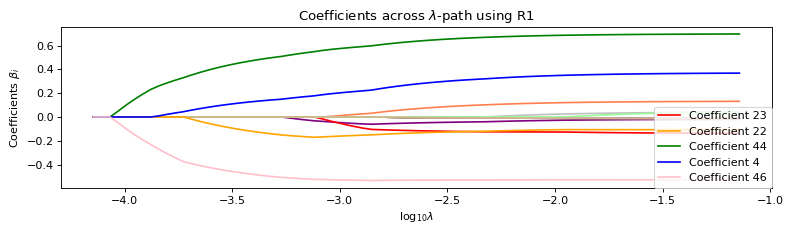

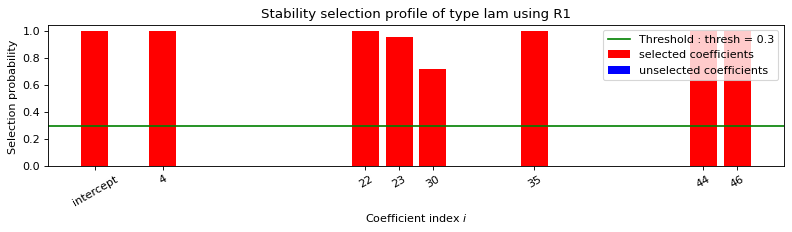

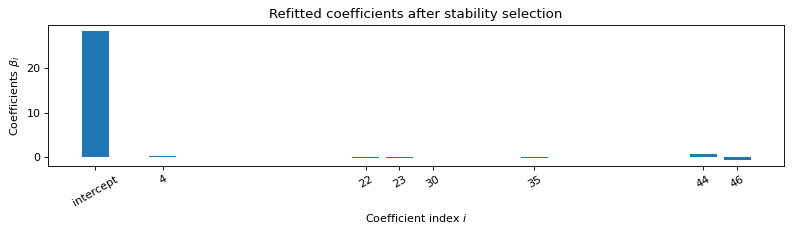


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.005s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    30    35    44    46    
   Running time :  0.093s

True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.    0.    0.28  0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.   -0.13 -0.24
  0.    0.    0.    0.    0.    0.    0.08  0.    0.    0.    0.   -0.1
  0.    0.    0.    0.    0.    0.    0.    0.    0.65  0.   -0.55]
Error: 0.2

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet 

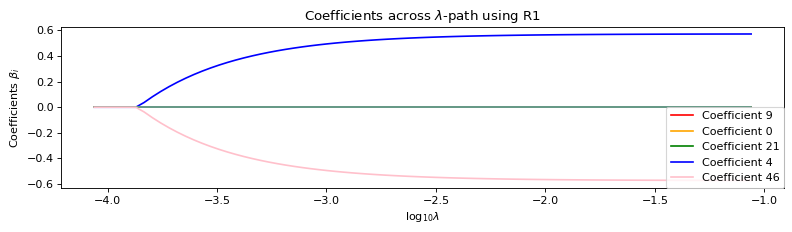

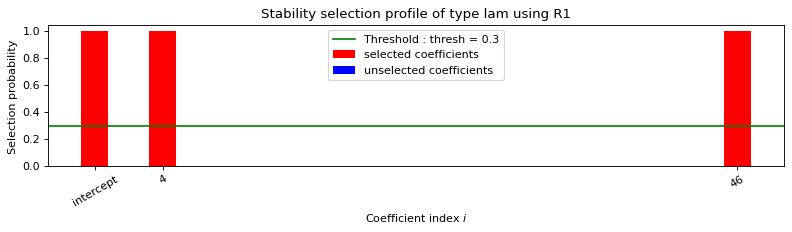

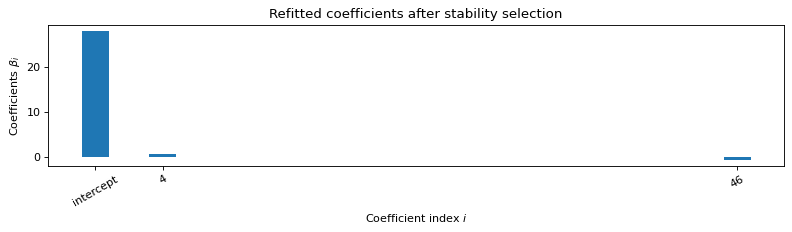


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.064s

True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.    0.    0.57  0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.   -0.57]
Error: 4.35

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>

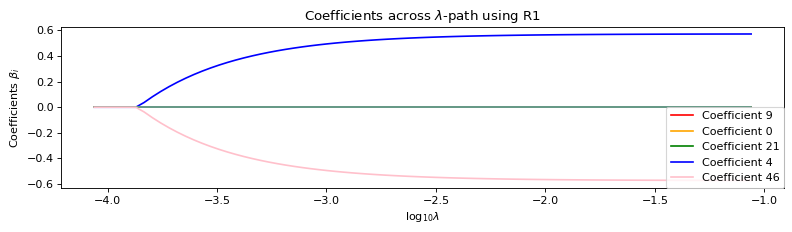

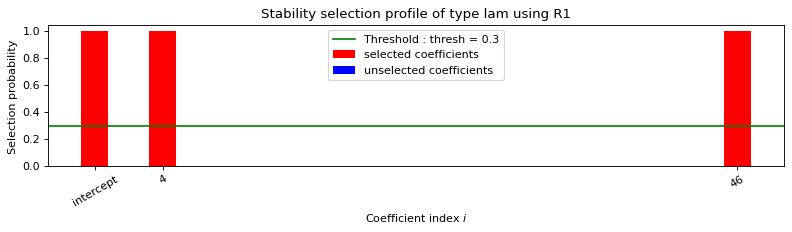

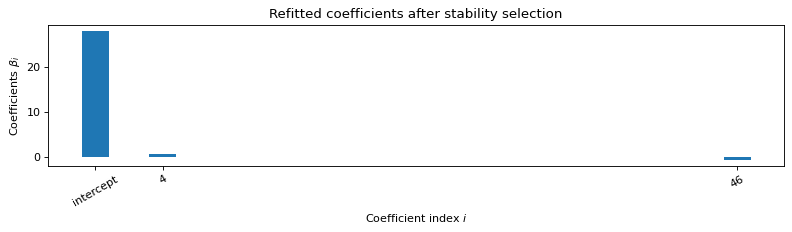

INFO:absl:Setup matrices...



 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.002s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.054s

True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.   -0.51  0.1   0.09  0.08  0.07  0.06  0.05  0.05  0.05
  0.04  0.04  0.04  0.03  0.03  0.03  0.03  0.03  0.03  0.03  0.02  0.02
  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02
  0.02  0.01  0.01  0.01  0.01  0.01  0.01  0.01  0.01  0.58]
Error: 4.35

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>

INFO:absl:Optimize lambda...
INFO:absl:KIV1 minimization did not succeed.
INFO:absl:Optimal lambda [-9.70916687]...
INFO:absl:Optimize xi...
INFO:absl:KIV2 minimization did not succeed.
INFO:absl:Optimal xi [-2.99573227]...
INFO:absl:Predict treatment effect...


Error: 6.24

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY SECOND STAGE - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 0.04

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV (manual) >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 9.11

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR ILR Regression Implementation >>>>>>>>>>>>>>>>>>>>>>>


/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/regression/linear_model.py:1817: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                  -96280.141
Model:                         IV2SLS   Adj. R-squared:            -100927.499
Method:                     Two Stage   F-statistic:                 5.076e-16
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Di, 03 Aug 2021                                         
Time:                        05:55:02                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         30.5611   3.67e+09   8.33e-09      1.0

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.   -0.36  0.07  0.06  0.05  0.05  0.04  0.04  0.03  0.03
  0.03  0.03  0.03  0.02  0.02  0.02  0.02  0.02  0.02  0.11  0.15  0.01
  0.01  0.01  0.01  0.01 -0.04 -0.14  0.01 -0.03  0.01  0.01  0.02  0.01
  0.01  0.01  0.01  0.01  0.01  0.01  0.01 -0.69  0.02  0.53]
Estimated Beta: [-0.01 -0.01 -0.01 -0.01  0.38 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.11 -0.15
 -0.01 -0.01 -0.01

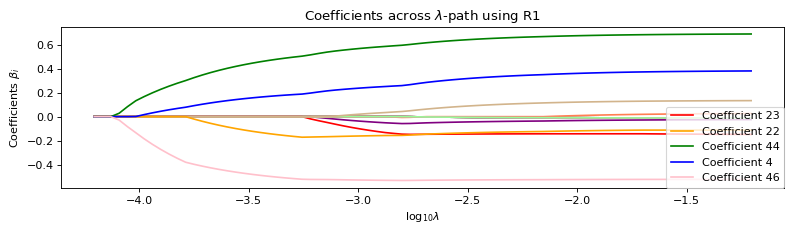

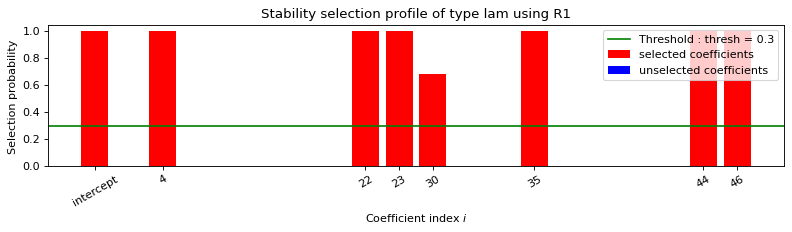

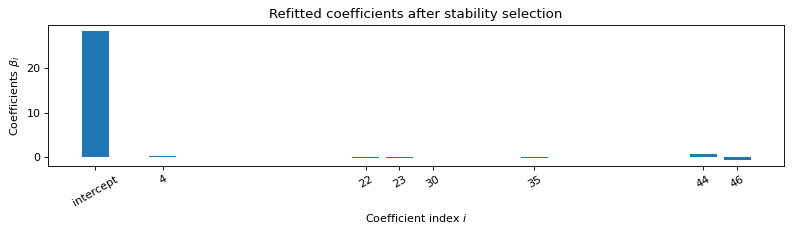


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.005s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    30    35    44    46    
   Running time :  0.105s

True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.    0.    0.29  0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.   -0.14 -0.23
  0.    0.    0.    0.    0.    0.    0.08  0.    0.    0.    0.   -0.1
  0.    0.    0.    0.    0.    0.    0.    0.    0.64  0.   -0.54]
Error: 0.17

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet

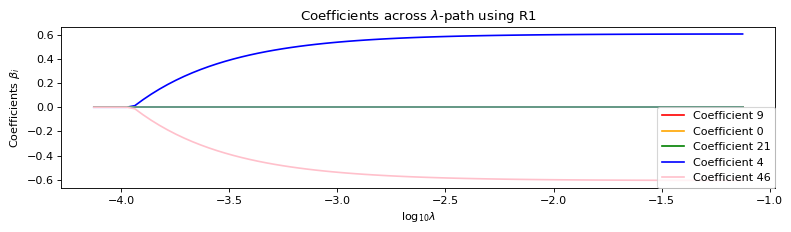

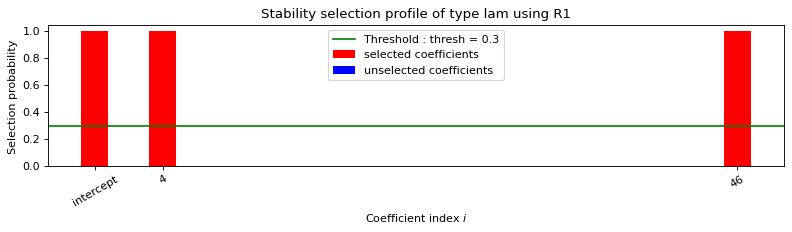

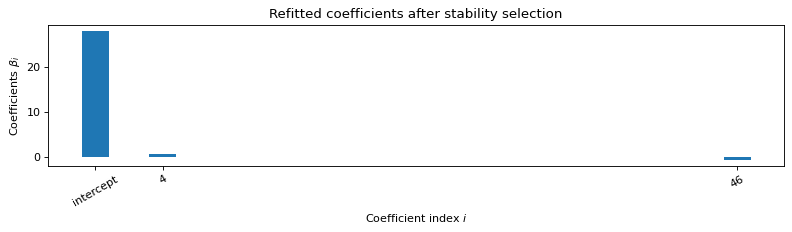


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.002s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.054s

True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.    0.    0.61  0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.   -0.61]
Error: 4.8

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>

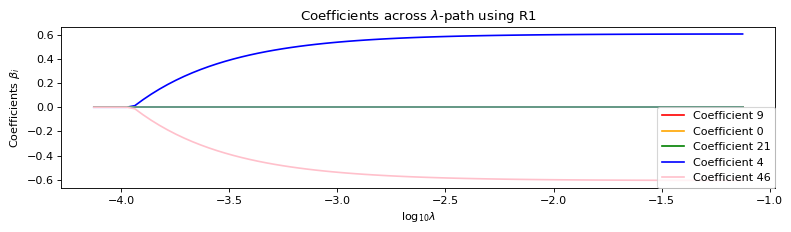

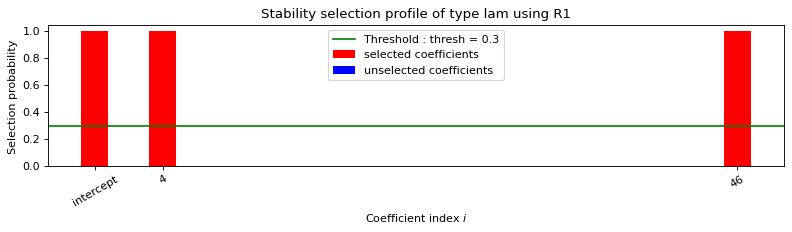

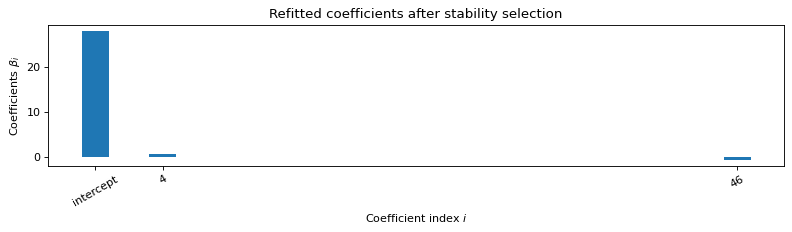

INFO:absl:Setup matrices...



 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.054s

True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.   -0.54  0.11  0.09  0.08  0.07  0.06  0.06  0.05  0.05
  0.04  0.04  0.04  0.04  0.03  0.03  0.03  0.03  0.03  0.03  0.03  0.02
  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02
  0.02  0.02  0.02  0.01  0.01  0.01  0.01  0.01  0.01  0.61]
Error: 4.8

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>

INFO:absl:Optimize lambda...
INFO:absl:Optimal lambda [-5.0425384]...
INFO:absl:Optimize xi...
INFO:absl:KIV2 minimization did not succeed.
INFO:absl:Optimal xi [-2.99573227]...
INFO:absl:Predict treatment effect...


Error: 6.1

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY SECOND STAGE - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 0.04

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV (manual) >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 8.78

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR ILR Regression Implementation >>>>>>>>>>>>>>>>>>>>>>>


/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/regression/linear_model.py:1817: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                  -85403.893
Model:                         IV2SLS   Adj. R-squared:             -89526.270
Method:                     Two Stage   F-statistic:                -1.102e-15
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Di, 03 Aug 2021                                         
Time:                        05:57:29                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -42.5720        nan        nan        n

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.   -0.35  0.07  0.06  0.05  0.05  0.04  0.04  0.03  0.03
  0.03  0.03  0.03  0.02  0.02  0.02  0.02  0.02  0.02  0.1   0.14  0.01
  0.01  0.01  0.01  0.01 -0.05 -0.14  0.01 -0.03  0.01  0.01  0.02  0.01
  0.01  0.01  0.01  0.01  0.01  0.01  0.01 -0.69  0.03  0.54]
Estimated Beta: [-0.01 -0.01 -0.01 -0.01  0.38 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.1  -0.14
 -0.01 -0.01 -0.01

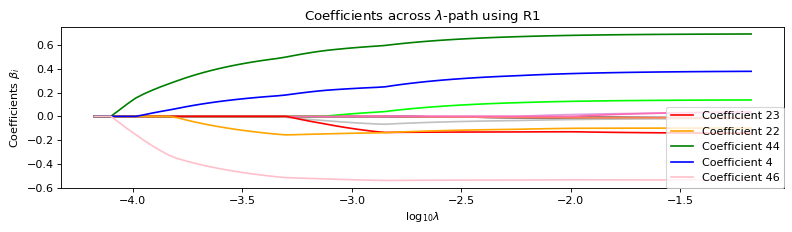

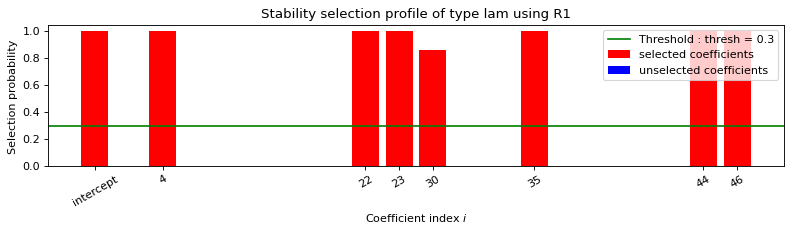

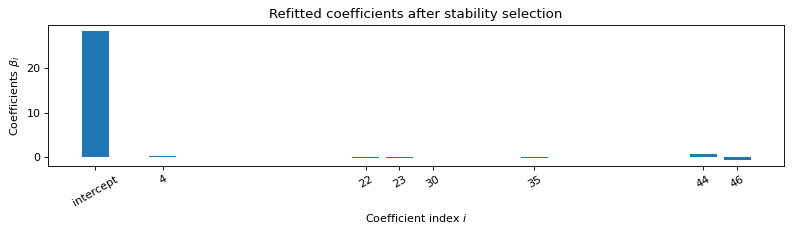


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.005s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    30    35    44    46    
   Running time :  0.082s

True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.    0.    0.28  0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.   -0.13 -0.22
  0.    0.    0.    0.    0.    0.    0.08  0.    0.    0.    0.   -0.1
  0.    0.    0.    0.    0.    0.    0.    0.    0.64  0.   -0.55]
Error: 0.19

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet

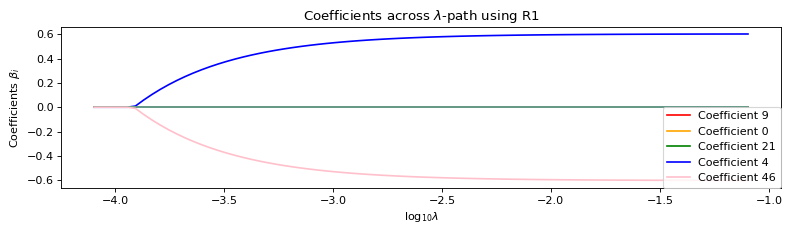

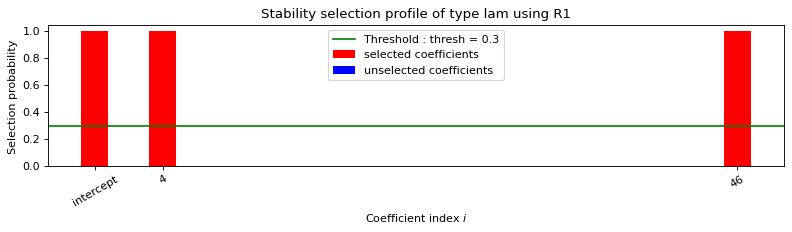

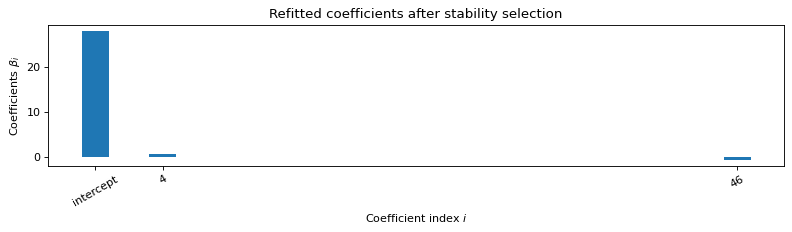


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.055s

True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.   0.   0.   0.   0.6  0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.  -0.6]
Error: 4.25

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


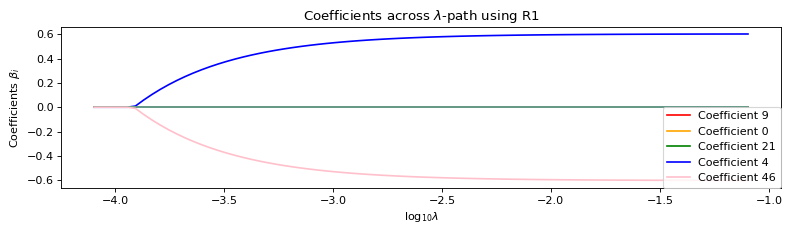

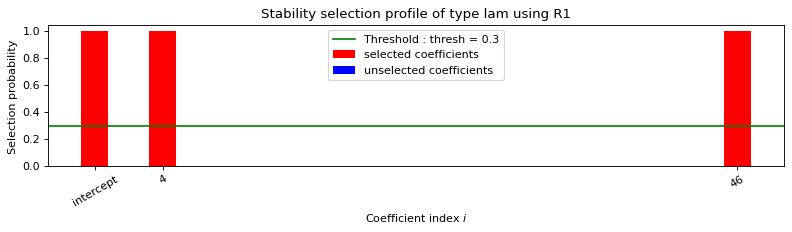

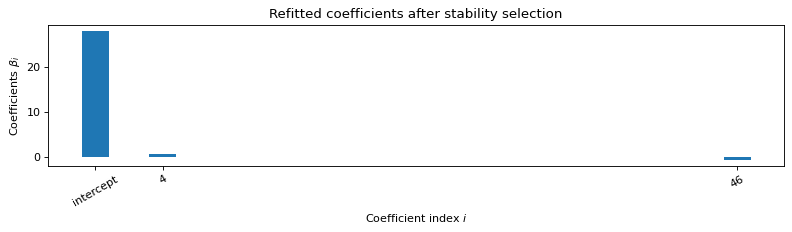

INFO:absl:Setup matrices...



 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.002s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.054s

True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.   -0.54  0.11  0.09  0.08  0.07  0.06  0.06  0.05  0.05
  0.04  0.04  0.04  0.04  0.03  0.03  0.03  0.03  0.03  0.03  0.03  0.02
  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02
  0.02  0.02  0.02  0.01  0.01  0.01  0.01  0.01  0.01  0.61]
Error: 4.25

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>

INFO:absl:Optimize lambda...
INFO:absl:KIV1 minimization did not succeed.
INFO:absl:Optimal lambda [-9.98947014]...
INFO:absl:Optimize xi...
INFO:absl:KIV2 minimization did not succeed.
INFO:absl:Optimal xi [-2.99573227]...
INFO:absl:Predict treatment effect...


Error: 9.67

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY SECOND STAGE - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 0.03

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV (manual) >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 8.04

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR ILR Regression Implementation >>>>>>>>>>>>>>>>>>>>>>>


/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/regression/linear_model.py:1817: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:              -512319385.428
Model:                         IV2SLS   Adj. R-squared:         -537048337.973
Method:                     Two Stage   F-statistic:                -2.239e-16
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Di, 03 Aug 2021                                         
Time:                        05:59:56                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       2116.5563        nan        nan        n

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.   -0.35  0.07  0.06  0.05  0.05  0.04  0.04  0.03  0.03
  0.03  0.03  0.03  0.02  0.02  0.02  0.02  0.02  0.02  0.1   0.13  0.01
  0.01  0.01  0.01  0.01 -0.04 -0.14  0.01 -0.04  0.01  0.01  0.01  0.01
  0.01  0.01  0.01  0.01  0.01  0.01  0.01 -0.68  0.03  0.52]
Estimated Beta: [-0.01 -0.01 -0.01 -0.01  0.38 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.1  -0.14
 -0.01 -0.01 -0.01

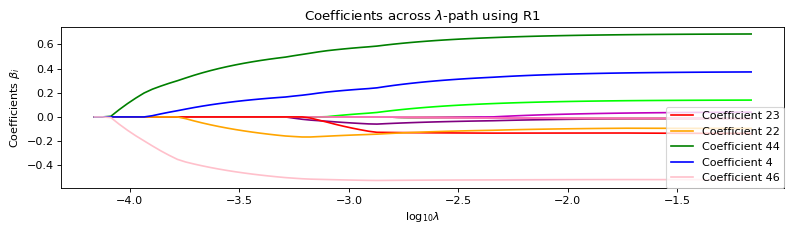

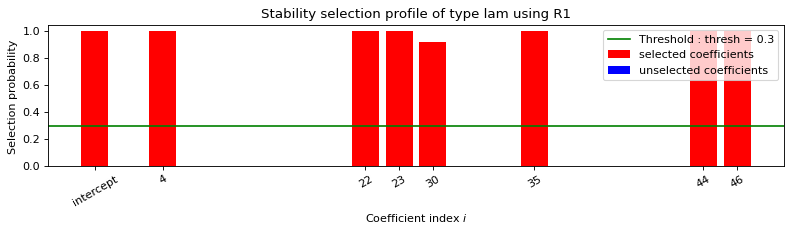

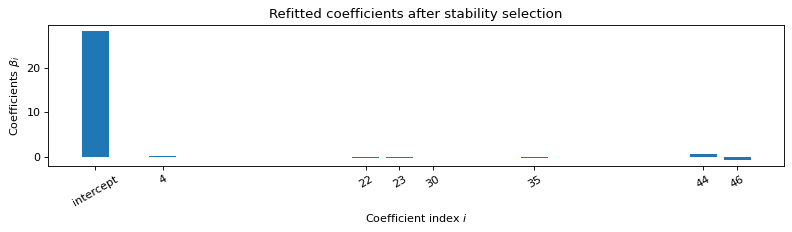


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    30    35    44    46    
   Running time :  0.081s

True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.    0.    0.29  0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.   -0.12 -0.26
  0.    0.    0.    0.    0.    0.    0.08  0.    0.    0.    0.   -0.1
  0.    0.    0.    0.    0.    0.    0.    0.    0.64  0.   -0.54]
Error: 0.17

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet

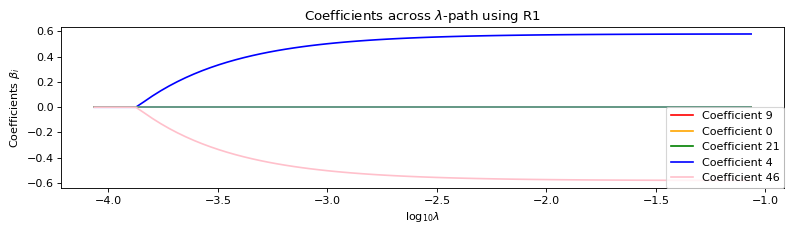

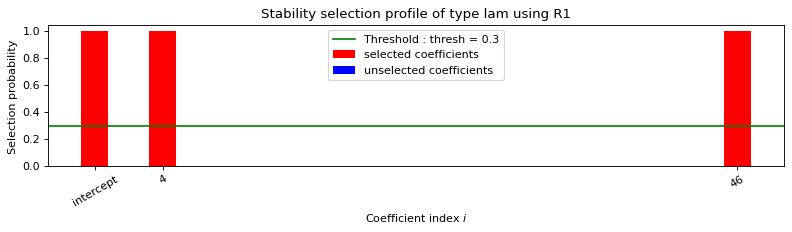

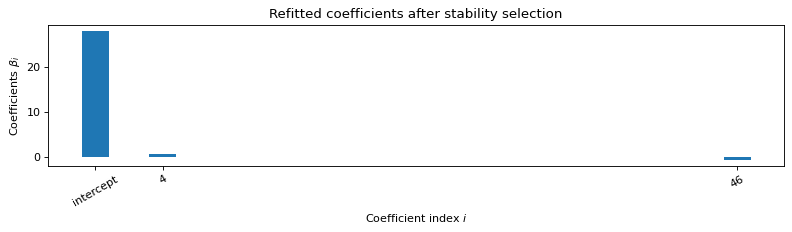


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.051s

True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.    0.    0.58  0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.   -0.58]
Error: 4.33

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>

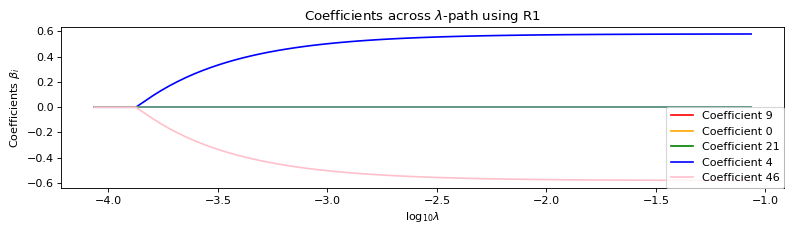

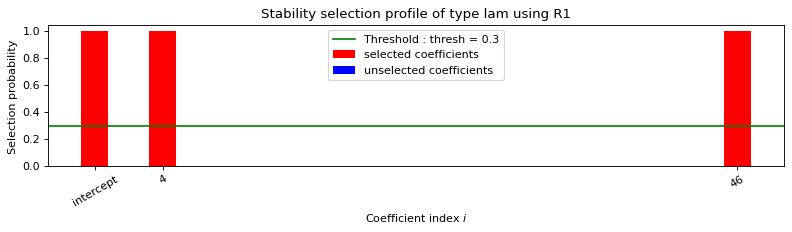

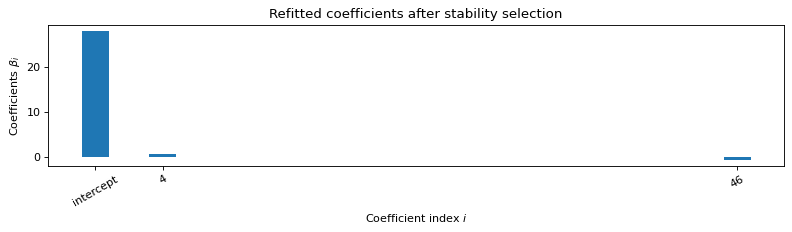

INFO:absl:Setup matrices...



 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.069s

True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.   -0.52  0.11  0.09  0.08  0.07  0.06  0.06  0.05  0.05
  0.04  0.04  0.04  0.04  0.03  0.03  0.03  0.03  0.03  0.03  0.02  0.02
  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02
  0.02  0.02  0.01  0.01  0.01  0.01  0.01  0.01  0.01  0.59]
Error: 4.33

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>

INFO:absl:Optimize lambda...
INFO:absl:KIV1 minimization did not succeed.
INFO:absl:Optimal lambda [-10.72996658]...
INFO:absl:Optimize xi...
INFO:absl:KIV2 minimization did not succeed.
INFO:absl:Optimal xi [-2.99573227]...
INFO:absl:Predict treatment effect...


Error: 6.17

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY SECOND STAGE - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 0.03

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV (manual) >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 9.27

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR ILR Regression Implementation >>>>>>>>>>>>>>>>>>>>>>>


/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/regression/linear_model.py:1817: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                 -107888.252
Model:                         IV2SLS   Adj. R-squared:            -113095.917
Method:                     Two Stage   F-statistic:                -1.936e-16
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Di, 03 Aug 2021                                         
Time:                        06:02:25                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -88.8535   1.14e+09  -7.83e-08      1.0

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.   -0.34  0.07  0.06  0.05  0.05  0.04  0.04  0.03  0.03
  0.03  0.03  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.09  0.16  0.01
  0.01  0.01  0.01  0.01 -0.03 -0.16  0.01 -0.05  0.01  0.01  0.    0.01
  0.01  0.01  0.01  0.01  0.01  0.01  0.01 -0.7   0.03  0.53]
Estimated Beta: [-0.01 -0.01 -0.01 -0.01  0.37 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.09 -0.16
 -0.01 -0.01 -0.01

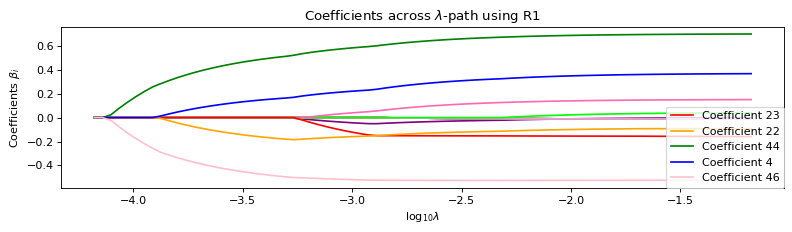

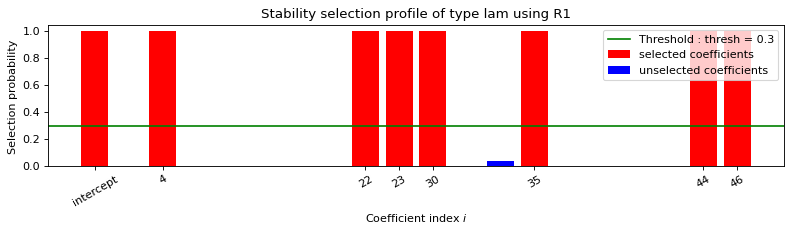

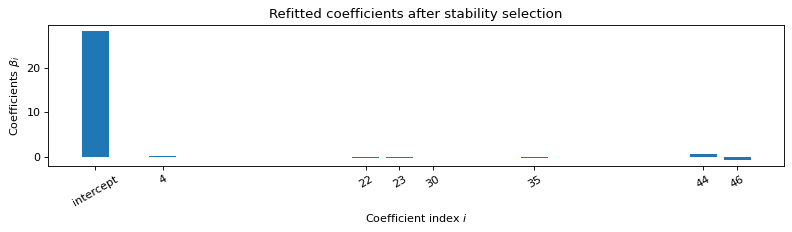


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.006s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    30    35    44    46    
   Running time :  0.084s

True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.    0.    0.28  0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.   -0.13 -0.27
  0.    0.    0.    0.    0.    0.    0.1   0.    0.    0.    0.   -0.09
  0.    0.    0.    0.    0.    0.    0.    0.    0.65  0.   -0.54]
Error: 0.2

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet

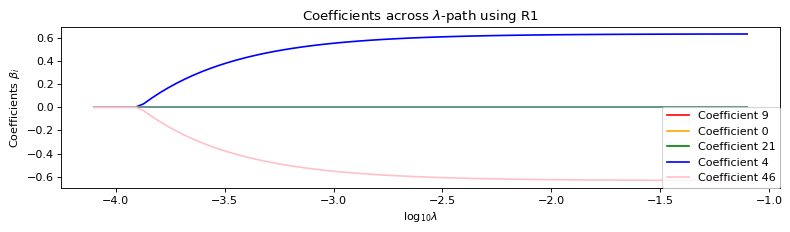

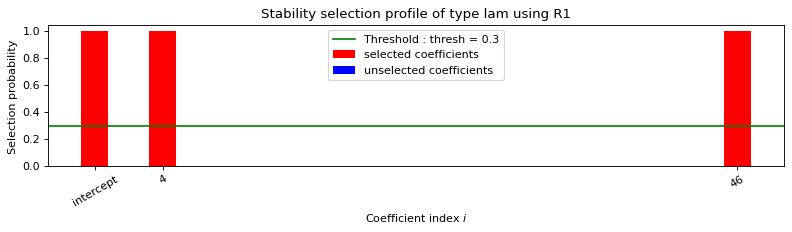

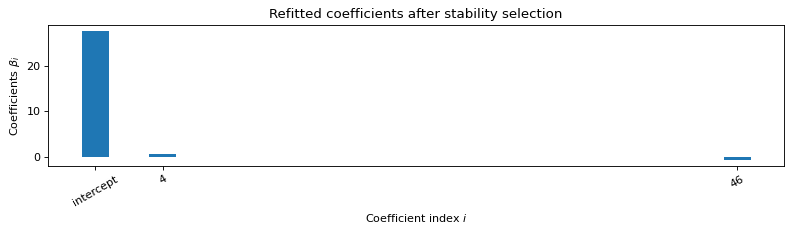


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.056s

True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.    0.    0.63  0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.   -0.63]
Error: 4.11

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>

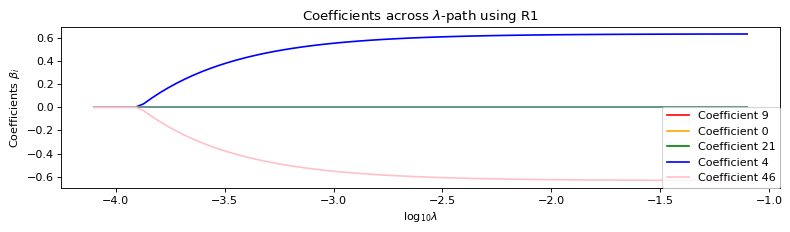

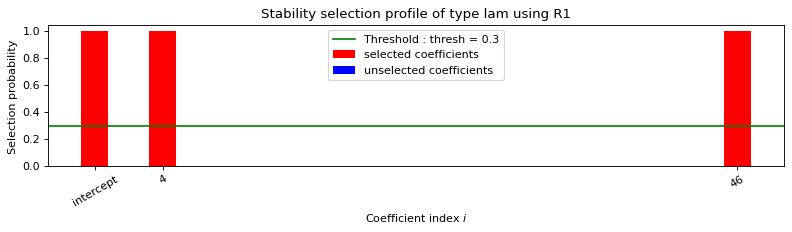

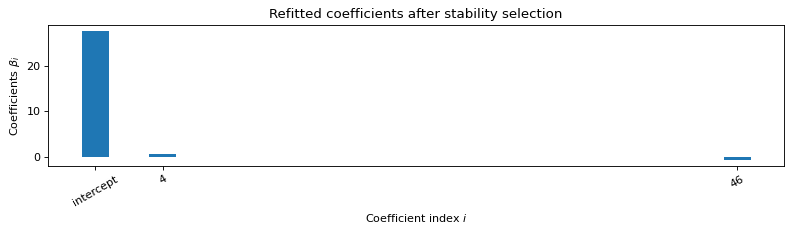

INFO:absl:Setup matrices...



 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.002s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.052s

True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.   -0.57  0.12  0.1   0.08  0.07  0.07  0.06  0.06  0.05
  0.05  0.04  0.04  0.04  0.04  0.03  0.03  0.03  0.03  0.03  0.03  0.03
  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02
  0.02  0.02  0.02  0.02  0.02  0.01  0.01  0.01  0.01  0.64]
Error: 4.11

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>

INFO:absl:Optimize lambda...
INFO:absl:KIV1 minimization did not succeed.
INFO:absl:Optimal lambda [-10.42927883]...
INFO:absl:Optimize xi...
INFO:absl:KIV2 minimization did not succeed.
INFO:absl:Optimal xi [-2.99573227]...
INFO:absl:Predict treatment effect...


Error: 9.51

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY SECOND STAGE - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 0.05

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV (manual) >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 10.99

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR ILR Regression Implementation >>>>>>>>>>>>>>>>>>>>>>>


/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/regression/linear_model.py:1817: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                  -97851.929
Model:                         IV2SLS   Adj. R-squared:            -102575.155
Method:                     Two Stage   F-statistic:                 3.385e-16
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Di, 03 Aug 2021                                         
Time:                        06:04:45                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         73.7225   2.18e+09   3.38e-08      1.0

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.   -0.34  0.07  0.06  0.05  0.04  0.04  0.04  0.03  0.03
  0.03  0.03  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.09  0.15  0.01
  0.01  0.01  0.01  0.01 -0.04 -0.14  0.01 -0.03  0.01  0.01  0.    0.01
  0.01  0.01  0.01  0.01  0.01  0.01  0.01 -0.7   0.02  0.53]
Estimated Beta: [-0.01 -0.01 -0.01 -0.01  0.37 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.09 -0.16
 -0.01 -0.01 -0.01

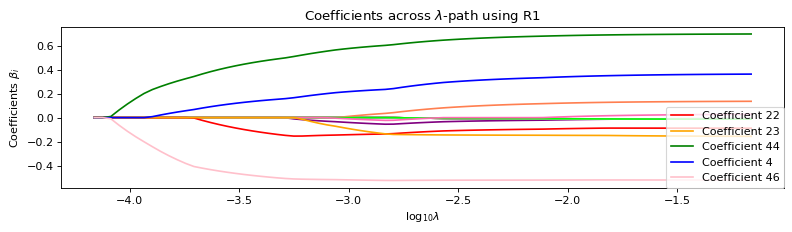

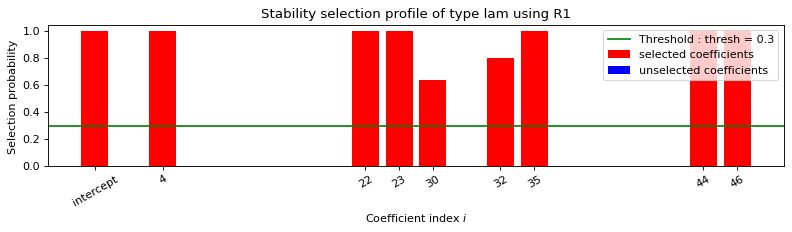

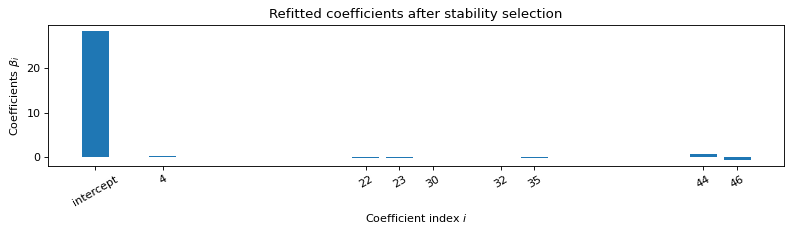


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.004s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    30    32    35    44    46    
   Running time :  0.086s

True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.    0.    0.28  0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.   -0.12 -0.23
  0.    0.    0.    0.    0.    0.    0.09  0.   -0.05  0.    0.   -0.08
  0.    0.    0.    0.    0.    0.    0.    0.    0.66  0.   -0.53]
Error: 0.14

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Di

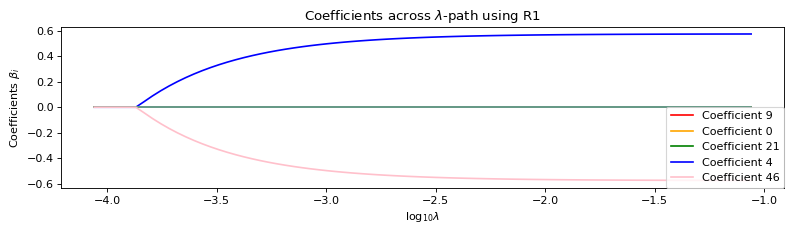

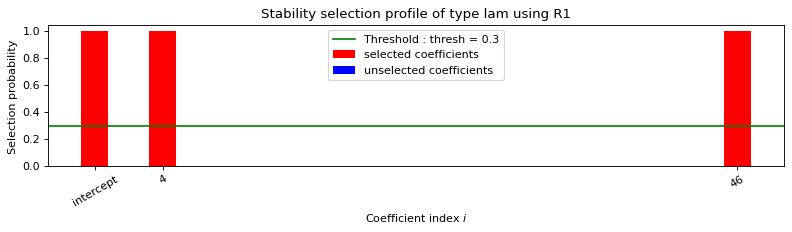

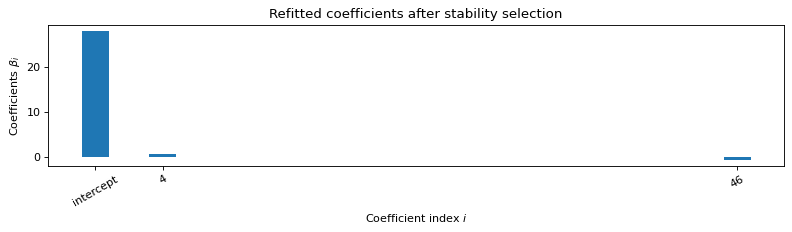


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.051s

True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.    0.    0.58  0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.   -0.58]
Error: 4.02

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>

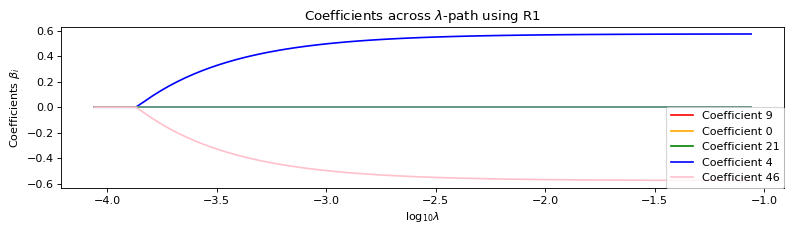

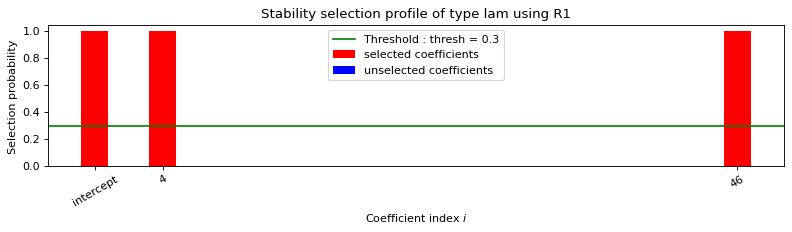

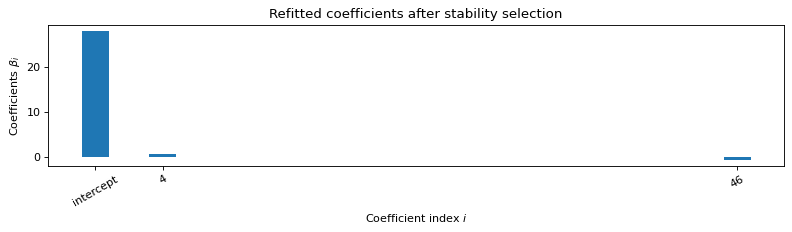

INFO:absl:Setup matrices...



 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.053s

True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.   -0.51  0.1   0.09  0.08  0.07  0.06  0.05  0.05  0.05
  0.04  0.04  0.04  0.03  0.03  0.03  0.03  0.03  0.03  0.03  0.02  0.02
  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02
  0.02  0.01  0.01  0.01  0.01  0.01  0.01  0.01  0.01  0.58]
Error: 4.02

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>

INFO:absl:Optimize lambda...
INFO:absl:KIV1 minimization did not succeed.
INFO:absl:Optimal lambda [-10.37582668]...
INFO:absl:Optimize xi...
INFO:absl:KIV2 minimization did not succeed.
INFO:absl:Optimal xi [-2.99573227]...
INFO:absl:Predict treatment effect...


Error: 6.56

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY SECOND STAGE - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 0.04

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV (manual) >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 9.52

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR ILR Regression Implementation >>>>>>>>>>>>>>>>>>>>>>>


/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/regression/linear_model.py:1817: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                -8712529.372
Model:                         IV2SLS   Adj. R-squared:           -9133071.237
Method:                     Two Stage   F-statistic:                -2.556e-14
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Di, 03 Aug 2021                                         
Time:                        06:07:05                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      -1536.9643   1.27e+11  -1.21e-08      1.0

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.   -0.36  0.07  0.06  0.05  0.05  0.04  0.04  0.03  0.03
  0.03  0.03  0.03  0.02  0.02  0.02  0.02  0.02  0.02  0.11  0.14  0.01
  0.01  0.01  0.01  0.01 -0.04 -0.15  0.01 -0.04  0.01  0.01  0.    0.01
  0.01  0.01  0.01  0.01  0.01  0.01  0.01 -0.7   0.03  0.53]
Estimated Beta: [-0.01 -0.01 -0.01 -0.01  0.38 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.1  -0.15
 -0.01 -0.01 -0.01

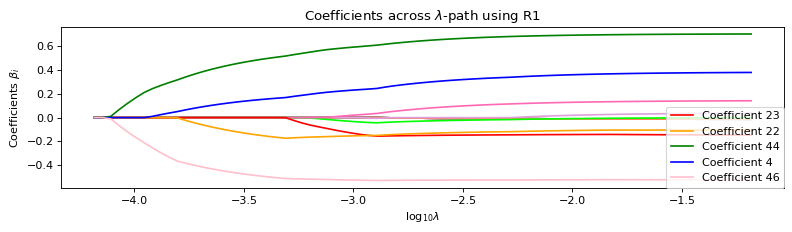

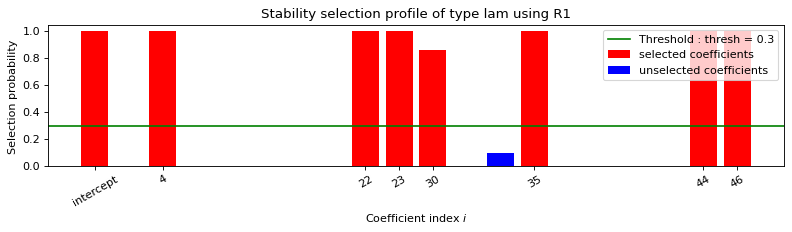

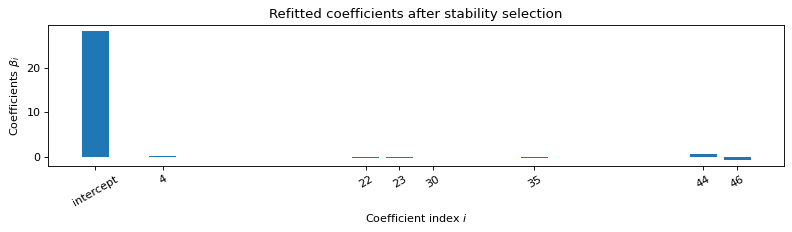


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.004s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    30    35    44    46    
   Running time :  0.072s

True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.    0.    0.29  0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.   -0.13 -0.26
  0.    0.    0.    0.    0.    0.    0.08  0.    0.    0.    0.   -0.09
  0.    0.    0.    0.    0.    0.    0.    0.    0.66  0.   -0.54]
Error: 0.16

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichle

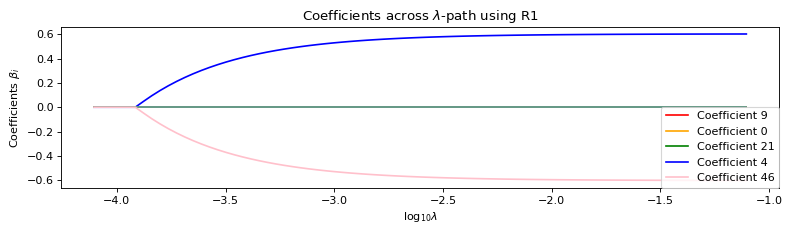

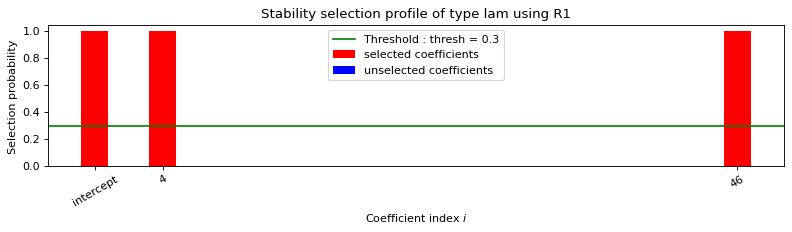

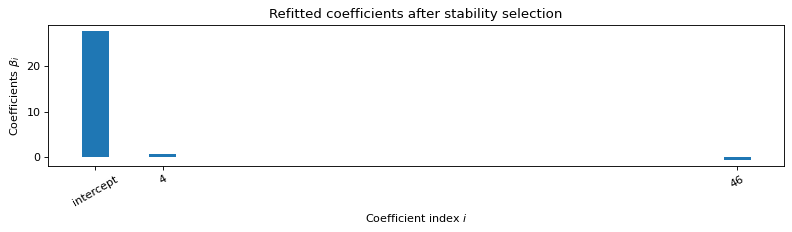


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.002s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.045s

True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.   0.   0.   0.   0.6  0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.  -0.6]
Error: 4.99

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


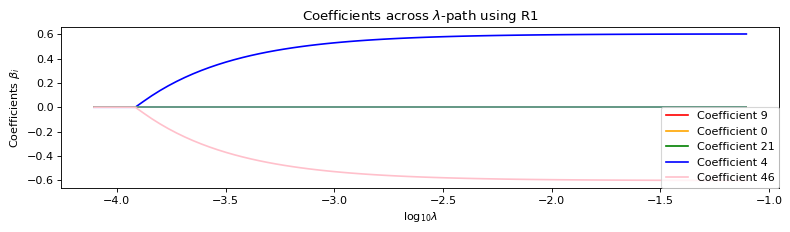

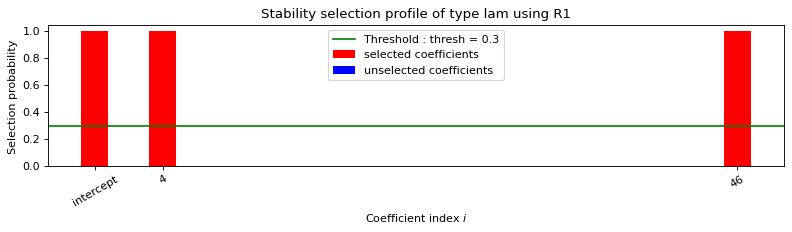

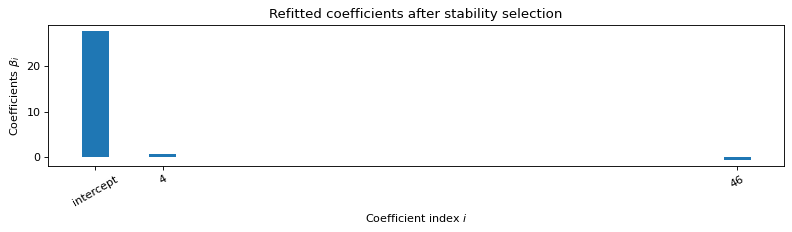

INFO:absl:Setup matrices...



 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.002s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.047s

True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.   -0.54  0.11  0.09  0.08  0.07  0.06  0.06  0.05  0.05
  0.04  0.04  0.04  0.04  0.03  0.03  0.03  0.03  0.03  0.03  0.03  0.02
  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02
  0.02  0.02  0.02  0.01  0.01  0.01  0.01  0.01  0.01  0.61]
Error: 4.99

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>

INFO:absl:Optimize lambda...
INFO:absl:KIV1 minimization did not succeed.
INFO:absl:Optimal lambda [-10.97084835]...
INFO:absl:Optimize xi...
INFO:absl:KIV2 minimization did not succeed.
INFO:absl:Optimal xi [-2.99573227]...
INFO:absl:Predict treatment effect...


Error: 6.57

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY SECOND STAGE - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 0.04

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV (manual) >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 9.17

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR ILR Regression Implementation >>>>>>>>>>>>>>>>>>>>>>>


/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/regression/linear_model.py:1817: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                  -17859.848
Model:                         IV2SLS   Adj. R-squared:             -18721.967
Method:                     Two Stage   F-statistic:                -1.436e-14
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Di, 03 Aug 2021                                         
Time:                        06:09:23                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -6.0896        nan        nan        n

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.   -0.36  0.07  0.06  0.05  0.05  0.04  0.04  0.03  0.03
  0.03  0.03  0.03  0.02  0.02  0.02  0.02  0.02  0.02  0.1   0.14  0.01
  0.01  0.01  0.01  0.01 -0.05 -0.14  0.01 -0.03  0.01  0.01  0.    0.01
  0.01  0.01  0.01  0.01  0.01  0.01  0.01 -0.7   0.03  0.53]
Estimated Beta: [-0.01 -0.01 -0.01 -0.01  0.38 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.1  -0.14
 -0.01 -0.01 -0.01

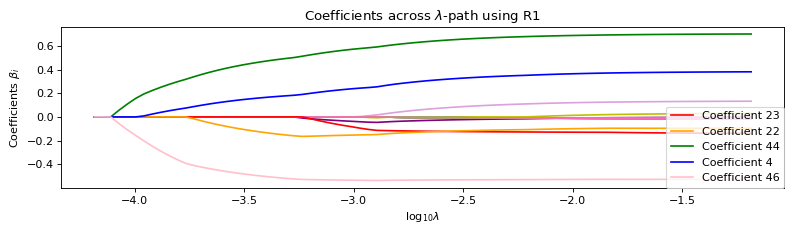

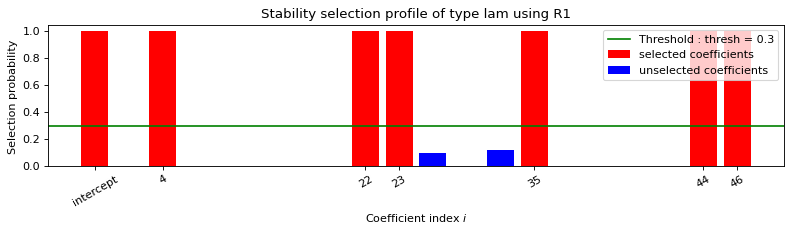

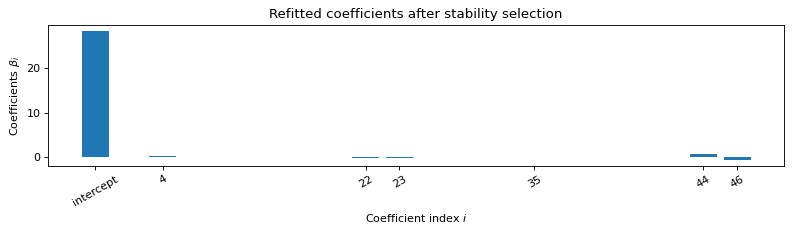


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.004s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    35    44    46    
   Running time :  0.067s

True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.    0.    0.31  0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.   -0.14 -0.21
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.   -0.08
  0.    0.    0.    0.    0.    0.    0.    0.    0.66  0.   -0.54]
Error: 0.18

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Lo

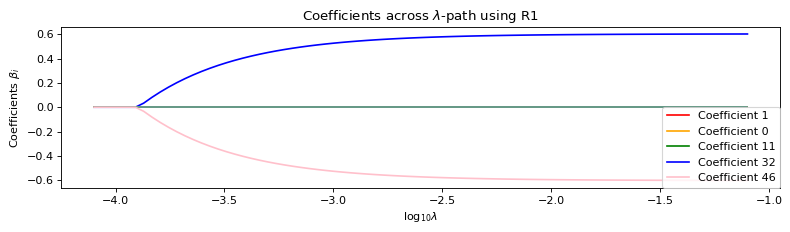

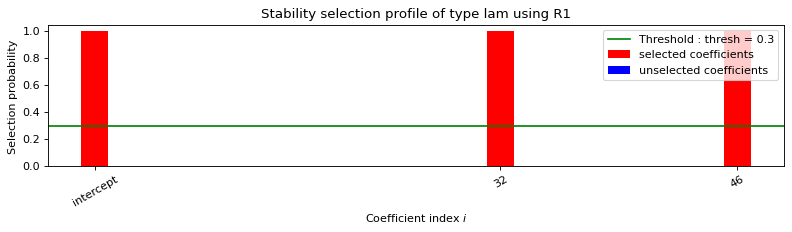

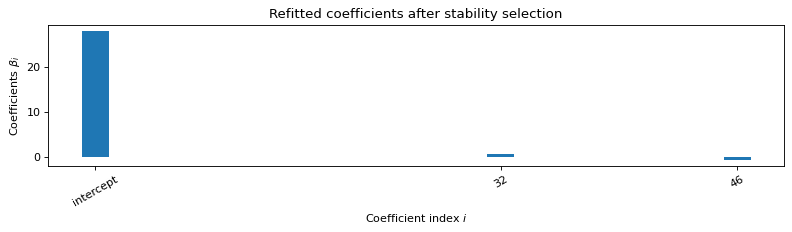


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.002s

 STABILITY SELECTION : 
   Selected variables :  intercept    32    46    
   Running time :  0.045s

True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.6  0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.  -0.6]
Error: 9.16

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


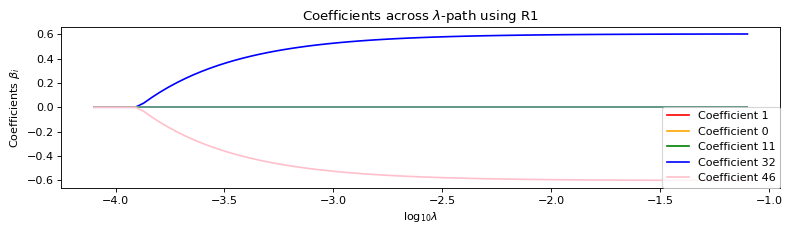

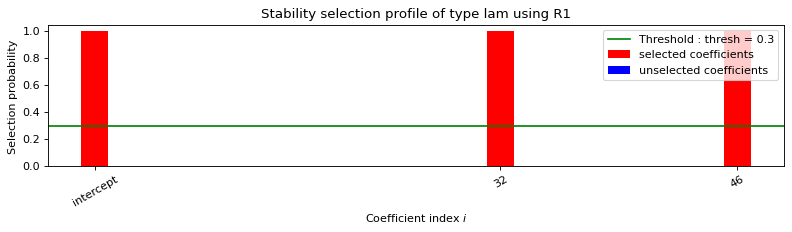

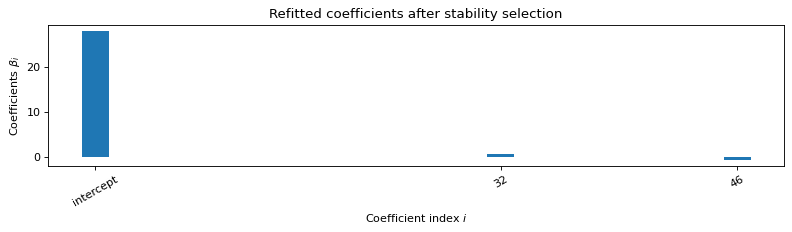

INFO:absl:Setup matrices...



 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.002s

 STABILITY SELECTION : 
   Selected variables :  intercept    32    46    
   Running time :  0.045s

True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.   -0.59  0.02  0.02  0.02  0.02
  0.02  0.02  0.02  0.01  0.01  0.01  0.01  0.01  0.01  0.61]
Error: 9.16

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>

INFO:absl:Optimize lambda...
INFO:absl:KIV1 minimization did not succeed.
INFO:absl:Optimal lambda [-10.5770105]...
INFO:absl:Optimize xi...
INFO:absl:KIV2 minimization did not succeed.
INFO:absl:Optimal xi [-2.99565476]...
INFO:absl:Predict treatment effect...


Error: 6.29

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY SECOND STAGE - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 0.03

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV (manual) >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 9.72

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR ILR Regression Implementation >>>>>>>>>>>>>>>>>>>>>>>


/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/regression/linear_model.py:1817: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                   -5146.058
Model:                         IV2SLS   Adj. R-squared:              -5394.500
Method:                     Two Stage   F-statistic:                -3.433e-15
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Di, 03 Aug 2021                                         
Time:                        06:11:41                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         19.3678   2.77e+09   6.99e-09      1.0

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.   -0.35  0.07  0.06  0.05  0.05  0.04  0.04  0.03  0.03
  0.03  0.03  0.03  0.02  0.02  0.02  0.02  0.02  0.02  0.11  0.15  0.01
  0.01  0.01  0.01  0.01 -0.06 -0.14  0.01 -0.02  0.01  0.01  0.01  0.01
  0.01  0.01  0.01  0.01  0.01  0.01  0.01 -0.69  0.02  0.55]
Estimated Beta: [-0.01 -0.01 -0.01 -0.01  0.38 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.1  -0.15
 -0.01 -0.01 -0.01

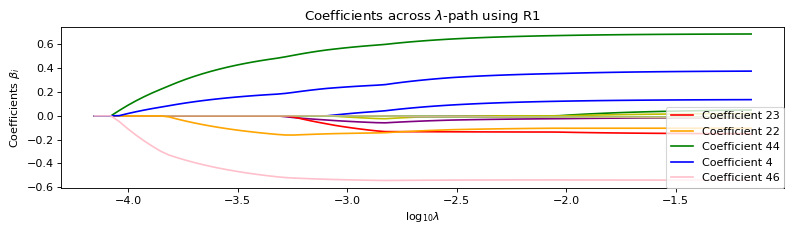

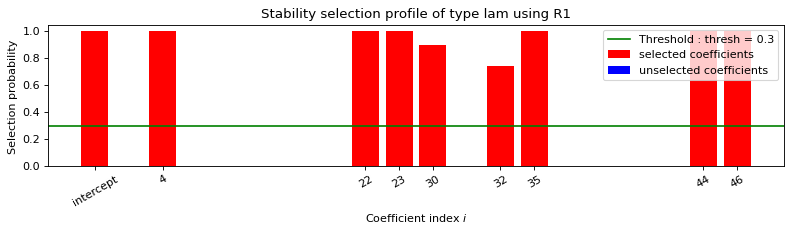

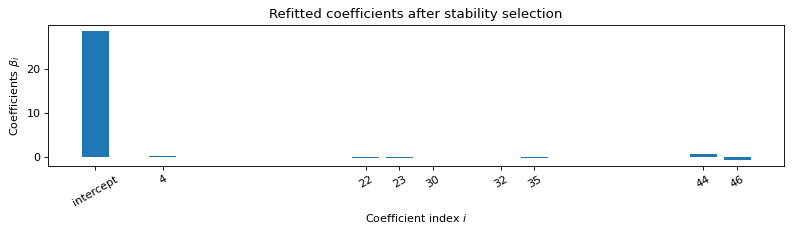


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.004s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    30    32    35    44    46    
   Running time :  0.077s

True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.    0.    0.3   0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.   -0.13 -0.21
  0.    0.    0.    0.    0.    0.    0.09  0.   -0.06  0.    0.   -0.09
  0.    0.    0.    0.    0.    0.    0.    0.    0.66  0.   -0.56]
Error: 0.13

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Di

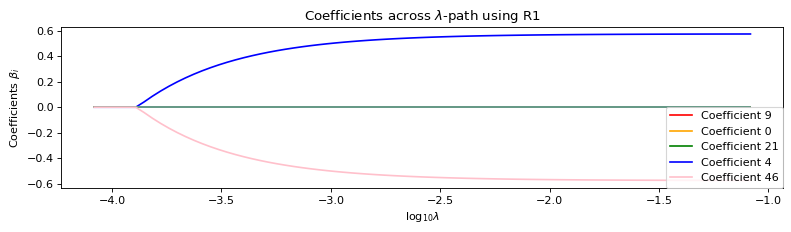

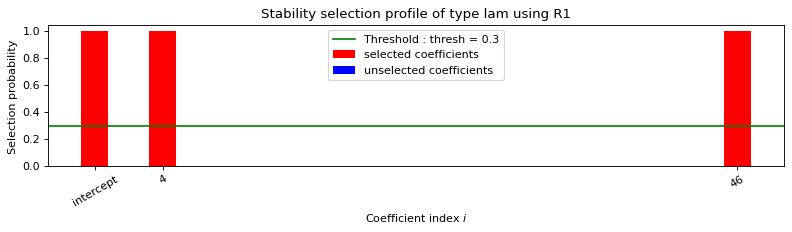

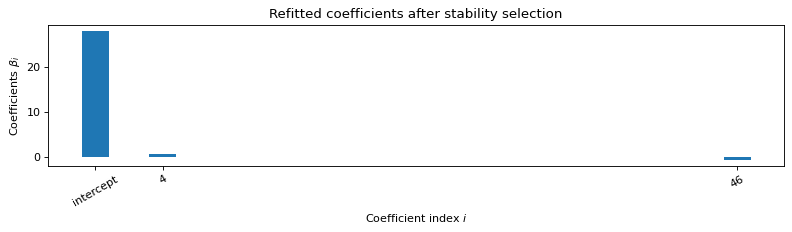


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.002s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.048s

True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.    0.    0.58  0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.   -0.58]
Error: 4.91

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>

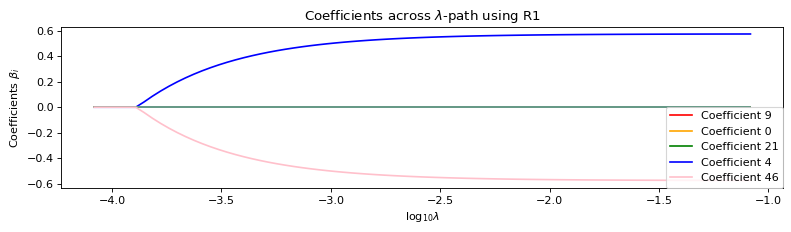

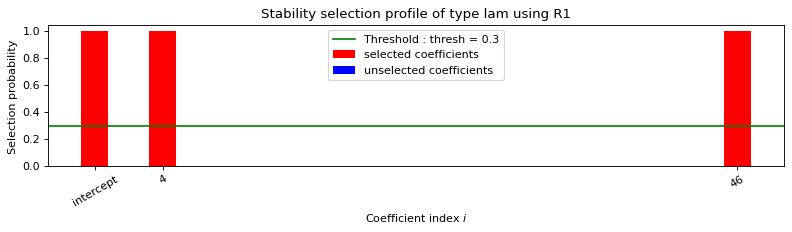

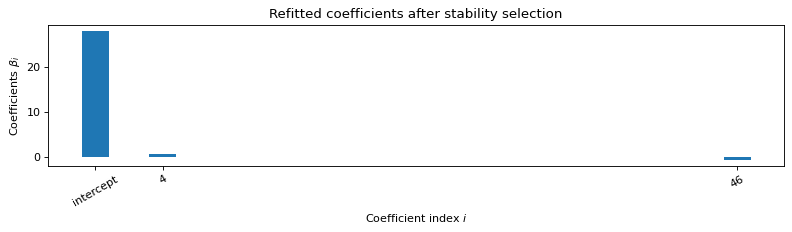

INFO:absl:Setup matrices...



 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.002s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.045s

True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.   -0.51  0.1   0.09  0.08  0.07  0.06  0.05  0.05  0.05
  0.04  0.04  0.04  0.03  0.03  0.03  0.03  0.03  0.03  0.03  0.02  0.02
  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02
  0.02  0.01  0.01  0.01  0.01  0.01  0.01  0.01  0.01  0.58]
Error: 4.91

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>

INFO:absl:Optimize lambda...
INFO:absl:Optimal lambda [-2.99573227]...
INFO:absl:Optimize xi...
INFO:absl:KIV2 minimization did not succeed.
INFO:absl:Optimal xi [-2.99573209]...
INFO:absl:Predict treatment effect...


Error: 7.21

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY SECOND STAGE - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 0.03

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV (manual) >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 8.84

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR ILR Regression Implementation >>>>>>>>>>>>>>>>>>>>>>>


/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/regression/linear_model.py:1817: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                 -326916.726
Model:                         IV2SLS   Adj. R-squared:            -342696.595
Method:                     Two Stage   F-statistic:                -4.072e-16
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Di, 03 Aug 2021                                         
Time:                        06:13:56                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         91.4398        nan        nan        n

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.   -0.35  0.07  0.06  0.05  0.05  0.04  0.04  0.03  0.03
  0.03  0.03  0.03  0.02  0.02  0.02  0.02  0.02  0.02  0.1   0.14  0.01
  0.01  0.01  0.01  0.01 -0.04 -0.14  0.01 -0.04  0.01  0.01  0.    0.01
  0.01  0.01  0.01  0.01  0.01  0.01  0.01 -0.68  0.02  0.53]
Estimated Beta: [-0.01 -0.01 -0.01 -0.01  0.38 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.1  -0.14
 -0.01 -0.01 -0.01

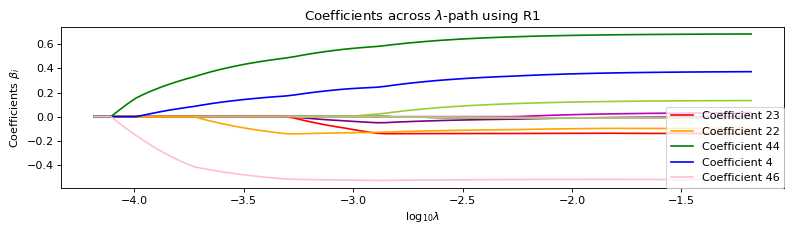

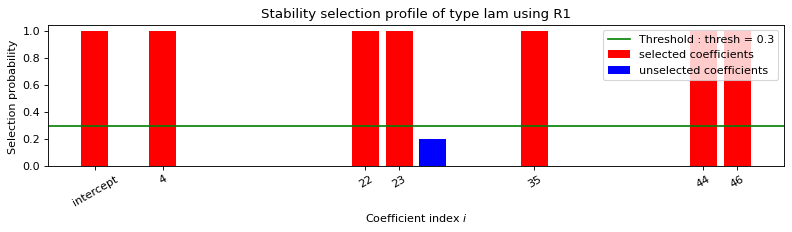

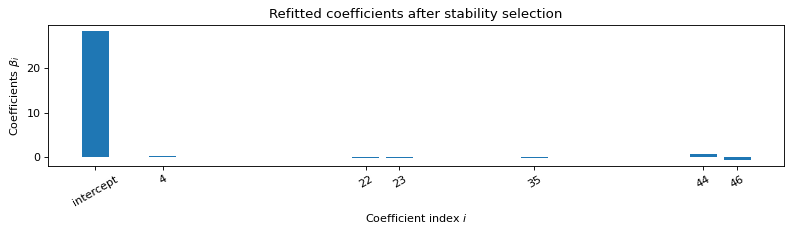


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.004s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    35    44    46    
   Running time :  0.067s

True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.    0.    0.3   0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.   -0.12 -0.21
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.   -0.08
  0.    0.    0.    0.    0.    0.    0.    0.    0.65  0.   -0.53]
Error: 0.2

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log

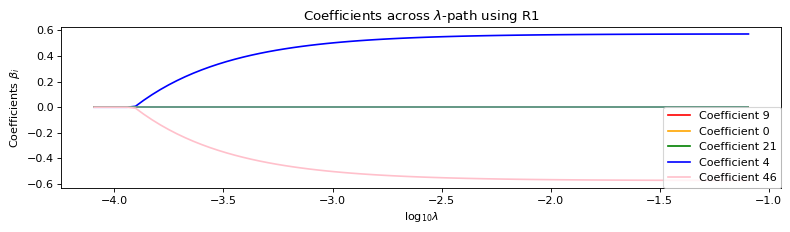

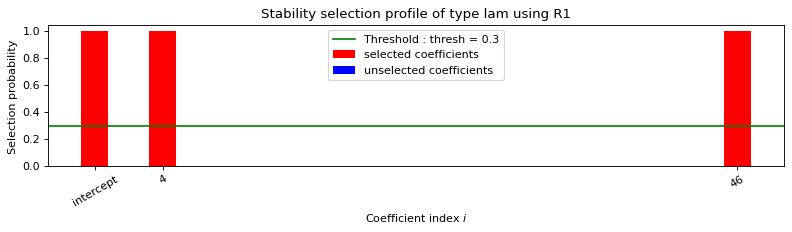

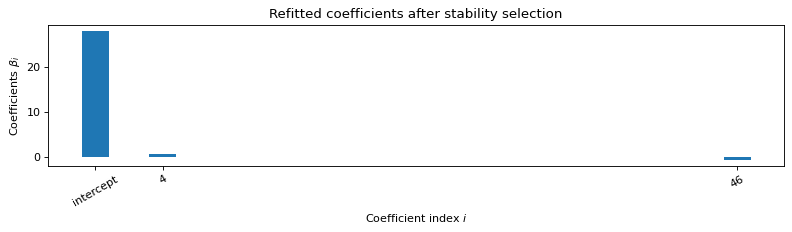


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.002s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.046s

True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.    0.    0.57  0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.   -0.57]
Error: 4.11

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>

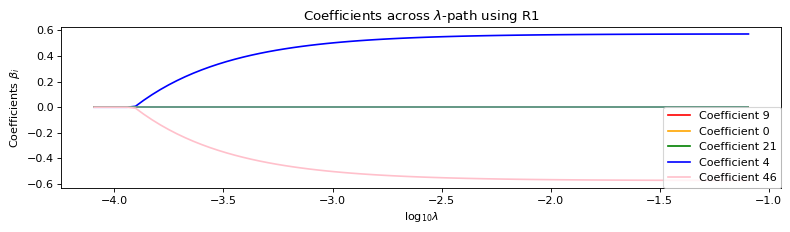

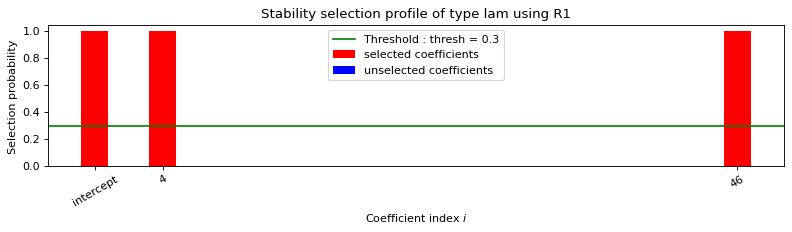

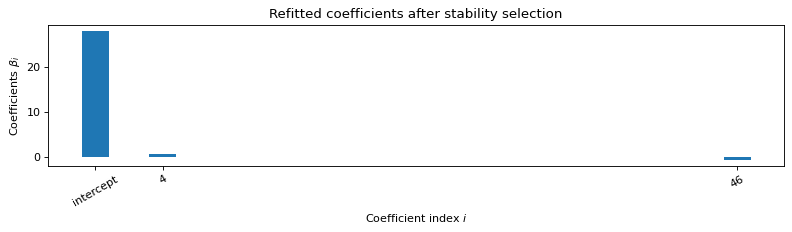

INFO:absl:Setup matrices...



 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.002s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.047s

True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.   -0.51  0.1   0.09  0.08  0.07  0.06  0.05  0.05  0.05
  0.04  0.04  0.04  0.03  0.03  0.03  0.03  0.03  0.03  0.03  0.02  0.02
  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02
  0.02  0.01  0.01  0.01  0.01  0.01  0.01  0.01  0.01  0.58]
Error: 4.11

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>

INFO:absl:Optimize lambda...
INFO:absl:Optimal lambda [-6.35236631]...
INFO:absl:Optimize xi...
INFO:absl:KIV2 minimization did not succeed.
INFO:absl:Optimal xi [-2.99573227]...
INFO:absl:Predict treatment effect...


Error: 6.01

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY SECOND STAGE - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 0.03

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV (manual) >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 8.31

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR ILR Regression Implementation >>>>>>>>>>>>>>>>>>>>>>>


/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/regression/linear_model.py:1817: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                -1837457.935
Model:                         IV2SLS   Adj. R-squared:           -1926149.552
Method:                     Two Stage   F-statistic:                -3.197e-17
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Di, 03 Aug 2021                                         
Time:                        06:16:10                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         40.1033        nan        nan        n

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.   -0.36  0.07  0.06  0.05  0.05  0.04  0.04  0.03  0.03
  0.03  0.03  0.03  0.02  0.02  0.02  0.02  0.02  0.02  0.09  0.13  0.01
  0.01  0.01  0.01  0.01 -0.03 -0.13  0.01 -0.04  0.01  0.01 -0.01  0.01
  0.01  0.01  0.01  0.01  0.01  0.01  0.01 -0.69  0.03  0.53]
Estimated Beta: [-0.01 -0.01 -0.01 -0.01  0.39 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.09 -0.13
 -0.01 -0.01 -0.01

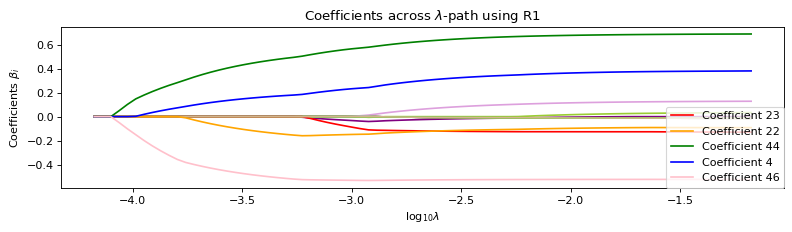

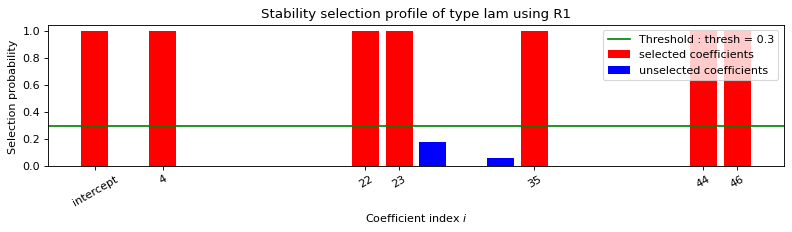

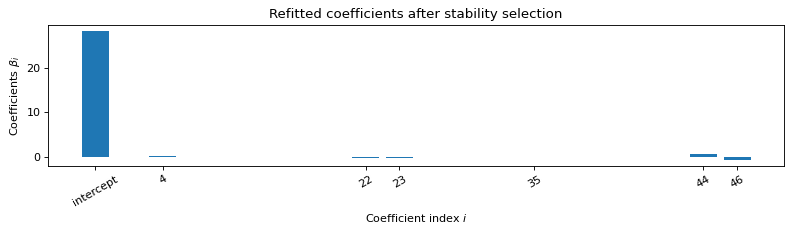


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.004s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    35    44    46    
   Running time :  0.07s

True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.    0.    0.3   0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.   -0.13 -0.22
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.   -0.07
  0.    0.    0.    0.    0.    0.    0.    0.    0.66  0.   -0.54]
Error: 0.19

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log

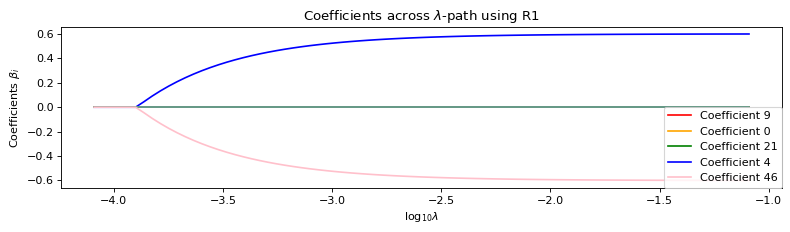

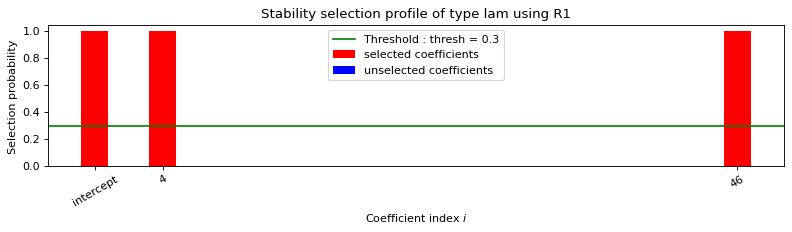

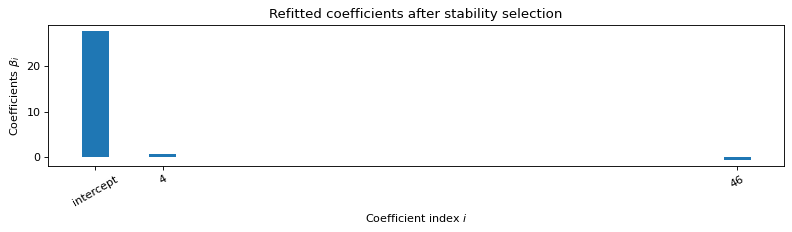


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.002s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.045s

True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.   0.   0.   0.   0.6  0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.  -0.6]
Error: 4.47

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


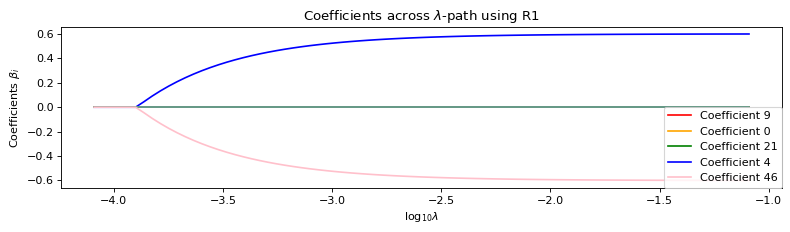

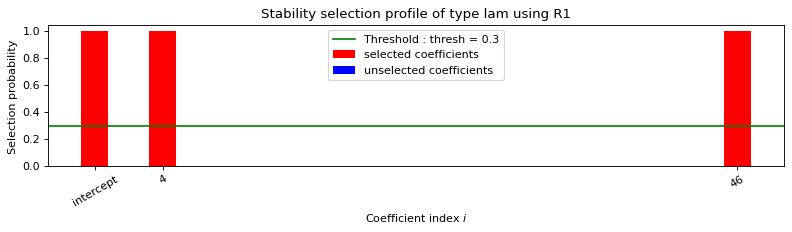

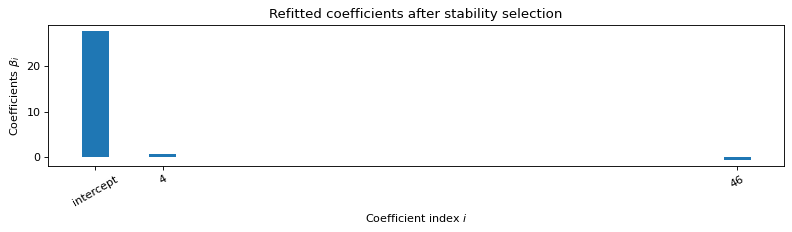

INFO:absl:Setup matrices...



 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.045s

True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.   -0.54  0.11  0.09  0.08  0.07  0.06  0.06  0.05  0.05
  0.04  0.04  0.04  0.04  0.03  0.03  0.03  0.03  0.03  0.03  0.03  0.02
  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02
  0.02  0.02  0.02  0.01  0.01  0.01  0.01  0.01  0.01  0.61]
Error: 4.47

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>

INFO:absl:Optimize lambda...
INFO:absl:KIV1 minimization did not succeed.
INFO:absl:Optimal lambda [-10.60607259]...
INFO:absl:Optimize xi...
INFO:absl:KIV2 minimization did not succeed.
INFO:absl:Optimal xi [-2.99573216]...
INFO:absl:Predict treatment effect...


Error: 6.03

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY SECOND STAGE - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 0.02

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV (manual) >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 9.17

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR ILR Regression Implementation >>>>>>>>>>>>>>>>>>>>>>>


/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/regression/linear_model.py:1817: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                 -124106.136
Model:                         IV2SLS   Adj. R-squared:            -130096.617
Method:                     Two Stage   F-statistic:                 3.777e-17
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Di, 03 Aug 2021                                         
Time:                        06:18:27                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       -212.9981        nan        nan        n

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.   -0.33  0.07  0.06  0.05  0.04  0.04  0.04  0.03  0.03
  0.03  0.03  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.09  0.13  0.01
  0.01  0.01  0.01  0.01 -0.02 -0.15  0.01 -0.05  0.01  0.01  0.01  0.01
  0.01  0.01  0.01  0.01  0.01  0.01  0.01 -0.7   0.03  0.54]
Estimated Beta: [-0.01 -0.01 -0.01 -0.01  0.36 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.09 -0.13
 -0.01 -0.01 -0.01

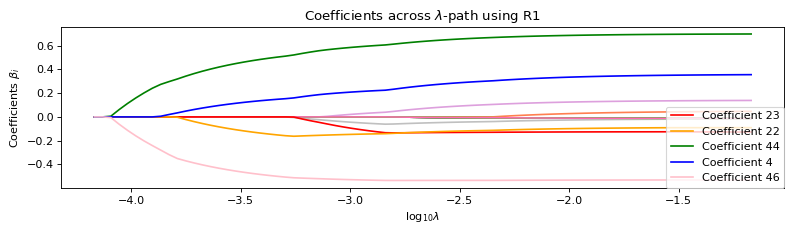

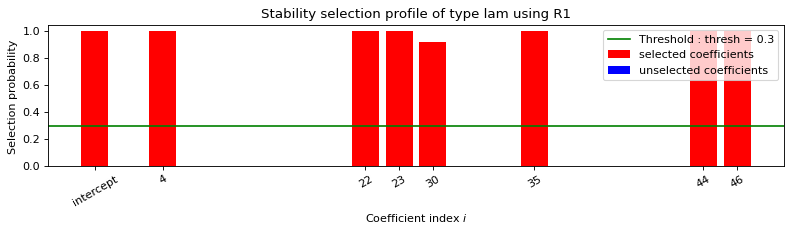

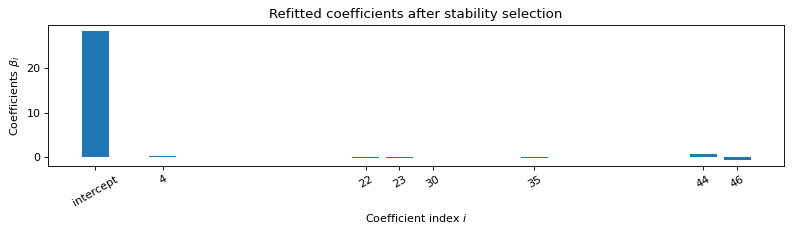


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    30    35    44    46    
   Running time :  0.071s

True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.    0.    0.26  0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.   -0.13 -0.22
  0.    0.    0.    0.    0.    0.    0.08  0.    0.    0.    0.   -0.1
  0.    0.    0.    0.    0.    0.    0.    0.    0.66  0.   -0.55]
Error: 0.18

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet

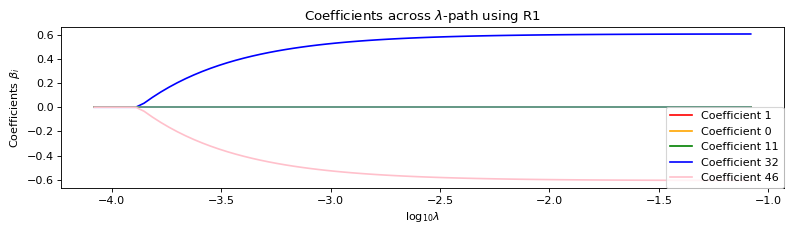

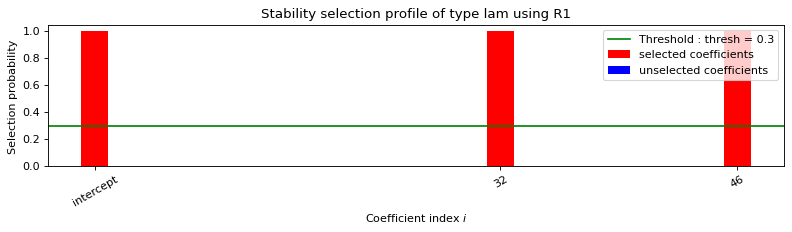

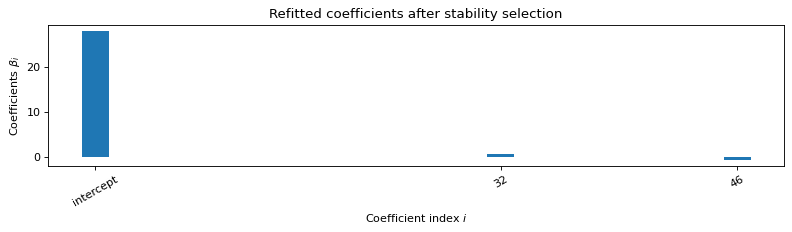


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.002s

 STABILITY SELECTION : 
   Selected variables :  intercept    32    46    
   Running time :  0.045s

True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.61  0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.   -0.61]
Error: 8.47

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>

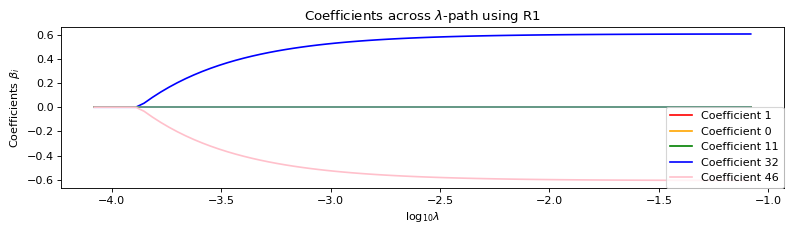

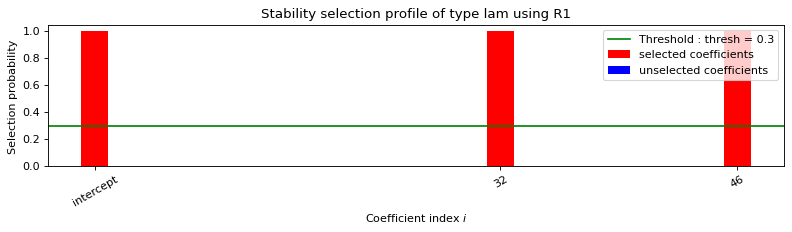

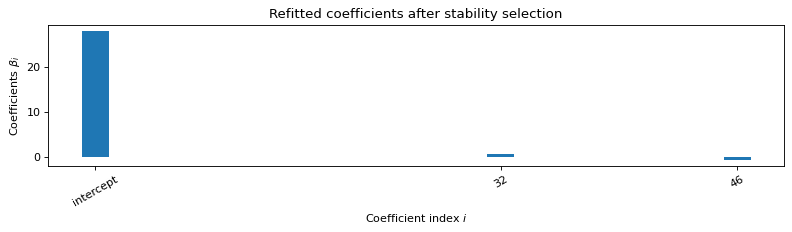

INFO:absl:Setup matrices...



 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.002s

 STABILITY SELECTION : 
   Selected variables :  intercept    32    46    
   Running time :  0.045s

True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.   -0.6   0.02  0.02  0.02  0.02
  0.02  0.02  0.02  0.01  0.01  0.01  0.01  0.01  0.01  0.61]
Error: 8.47

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>

INFO:absl:Optimize lambda...
INFO:absl:KIV1 minimization did not succeed.
INFO:absl:Optimal lambda [-10.44453892]...
INFO:absl:Optimize xi...
INFO:absl:KIV2 minimization did not succeed.
INFO:absl:Optimal xi [-2.99574168]...
INFO:absl:Predict treatment effect...


Error: 7.42

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY SECOND STAGE - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 0.05

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV (manual) >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 9.85

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR ILR Regression Implementation >>>>>>>>>>>>>>>>>>>>>>>


/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/regression/linear_model.py:1817: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                 -129918.500
Model:                         IV2SLS   Adj. R-squared:            -136189.535
Method:                     Two Stage   F-statistic:                 2.379e-17
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Di, 03 Aug 2021                                         
Time:                        06:20:44                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         19.7516   4.16e+09   4.74e-09      1.0

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.   -0.35  0.07  0.06  0.05  0.05  0.04  0.04  0.03  0.03
  0.03  0.03  0.03  0.02  0.02  0.02  0.02  0.02  0.02  0.12  0.13  0.01
  0.01  0.01  0.01  0.01 -0.06 -0.13  0.01 -0.03  0.01  0.01  0.01  0.01
  0.01  0.01  0.01  0.01  0.01  0.01  0.01 -0.69  0.02  0.53]
Estimated Beta: [-0.01 -0.01 -0.01 -0.01  0.38 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.11 -0.14
 -0.01 -0.01 -0.01

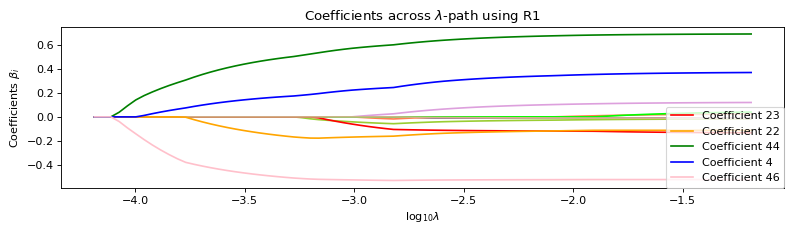

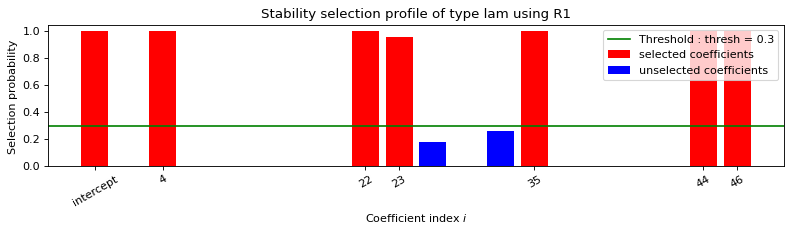

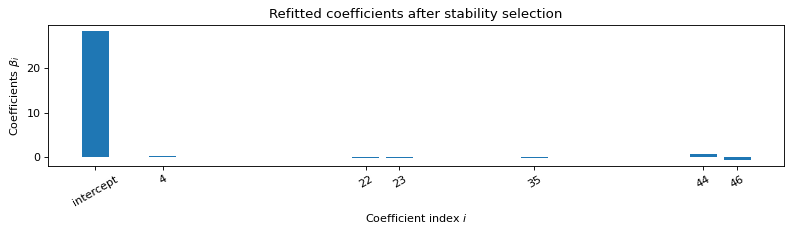


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.004s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    35    44    46    
   Running time :  0.07s

True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.    0.    0.29  0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.   -0.15 -0.18
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.   -0.08
  0.    0.    0.    0.    0.    0.    0.    0.    0.66  0.   -0.54]
Error: 0.18

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log

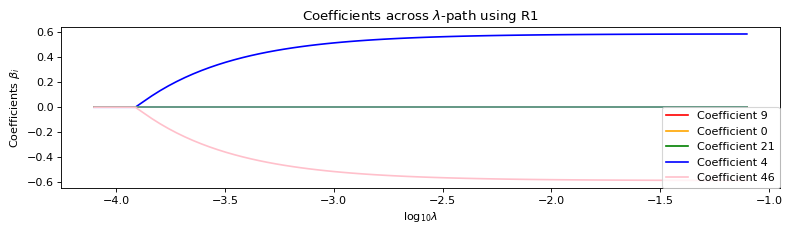

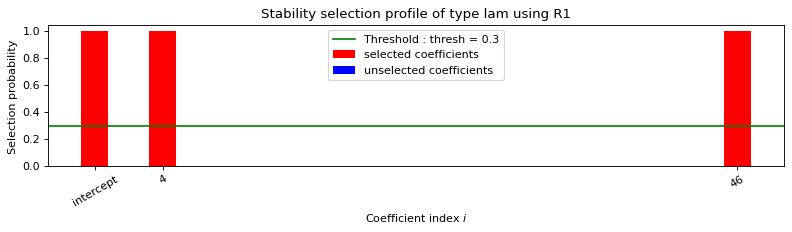

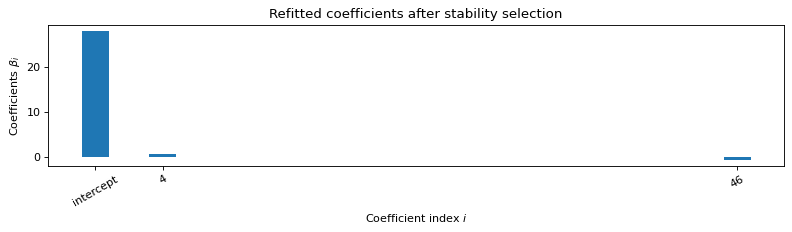


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.002s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.045s

True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.    0.    0.59  0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.   -0.59]
Error: 4.45

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>

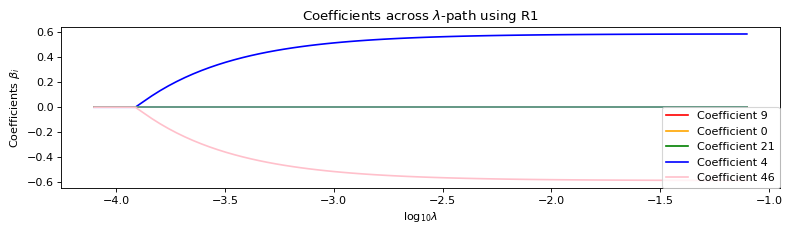

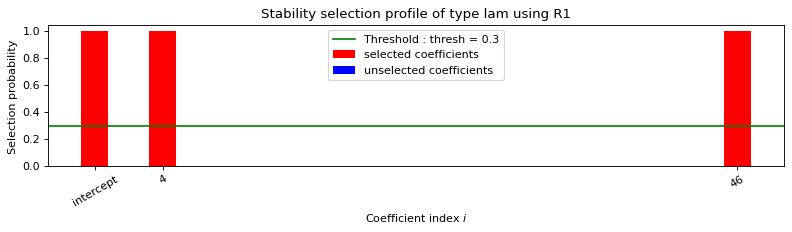

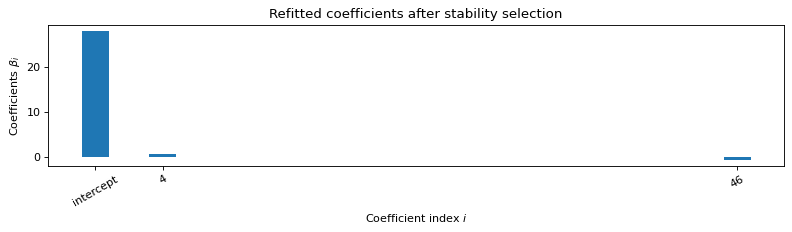

INFO:absl:Setup matrices...



 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.002s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.044s

True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.   -0.52  0.11  0.09  0.08  0.07  0.06  0.06  0.05  0.05
  0.04  0.04  0.04  0.04  0.03  0.03  0.03  0.03  0.03  0.03  0.02  0.02
  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02
  0.02  0.02  0.01  0.01  0.01  0.01  0.01  0.01  0.01  0.59]
Error: 4.45

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>

INFO:absl:Optimize lambda...
INFO:absl:Optimal lambda [-2.53844123]...
INFO:absl:Optimize xi...
INFO:absl:KIV2 minimization did not succeed.
INFO:absl:Optimal xi [-2.99573227]...
INFO:absl:Predict treatment effect...


Error: 7.1

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY SECOND STAGE - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 0.03

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV (manual) >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 8.2

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR ILR Regression Implementation >>>>>>>>>>>>>>>>>>>>>>>


/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/regression/linear_model.py:1817: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:               -14903812.780
Model:                         IV2SLS   Adj. R-squared:          -15623199.384
Method:                     Two Stage   F-statistic:                 2.306e-18
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Di, 03 Aug 2021                                         
Time:                        06:23:00                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -15.9907        nan        nan        n

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.   -0.34  0.07  0.06  0.05  0.05  0.04  0.04  0.03  0.03
  0.03  0.03  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.09  0.17  0.01
  0.01  0.01  0.01  0.   -0.03 -0.14  0.01 -0.04  0.01  0.01  0.    0.01
  0.01  0.01  0.01  0.01  0.01  0.01  0.01 -0.71  0.02  0.54]
Estimated Beta: [-0.01 -0.01 -0.01 -0.01  0.37 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.09 -0.17
 -0.01 -0.01 -0.01

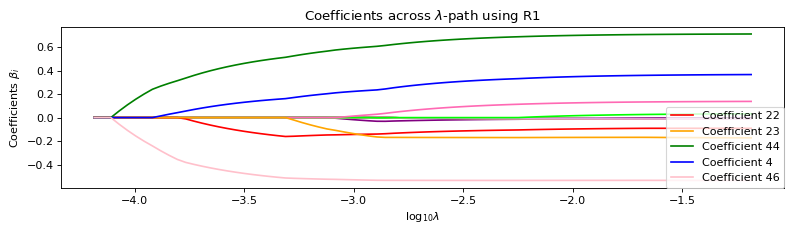

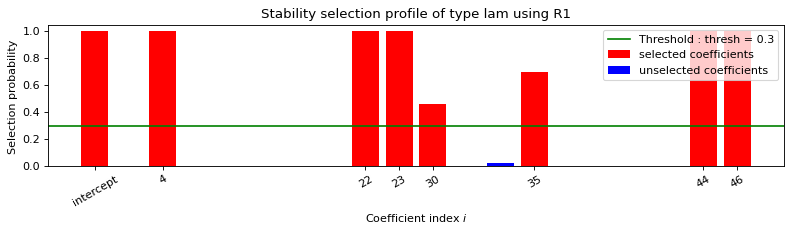

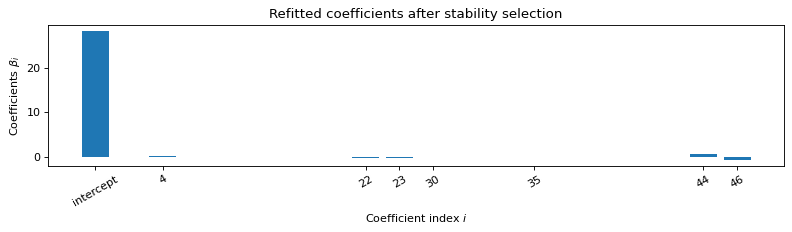


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.004s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    30    35    44    46    
   Running time :  0.069s

True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.    0.    0.28  0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.   -0.13 -0.27
  0.    0.    0.    0.    0.    0.    0.08  0.    0.    0.    0.   -0.08
  0.    0.    0.    0.    0.    0.    0.    0.    0.66  0.   -0.55]
Error: 0.2

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet

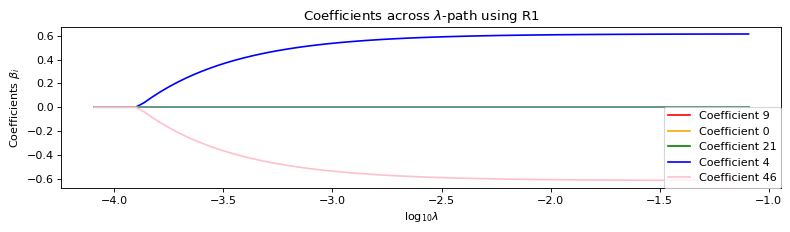

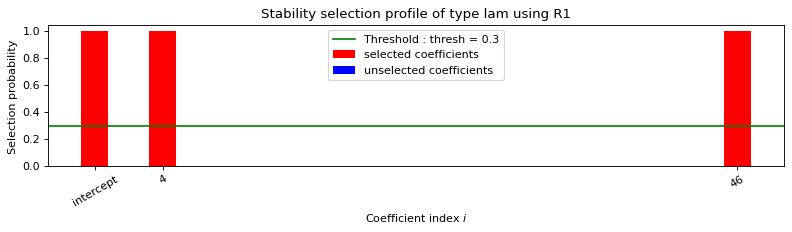

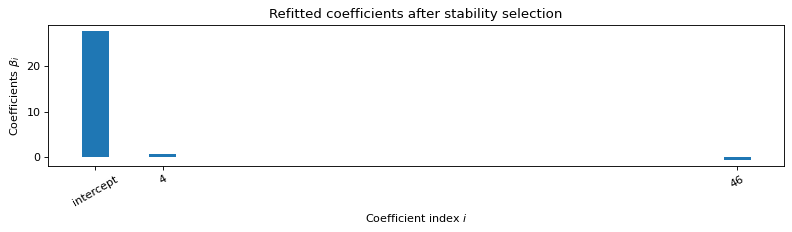


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.002s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.045s

True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.    0.    0.62  0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.   -0.62]
Error: 4.79

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>

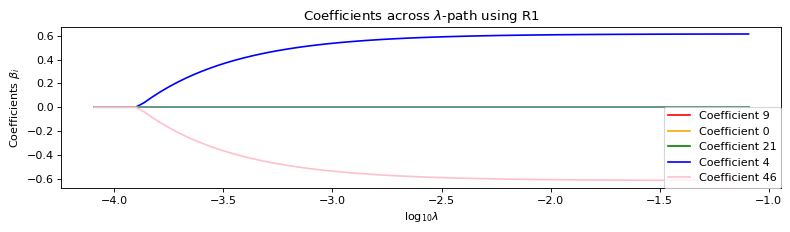

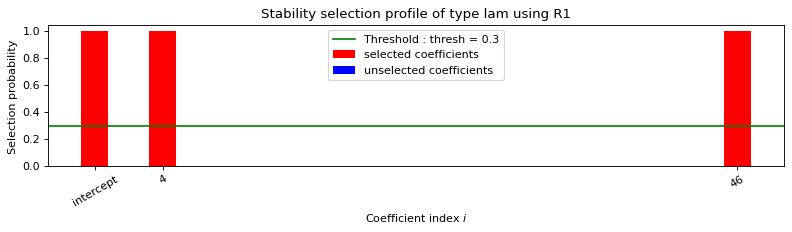

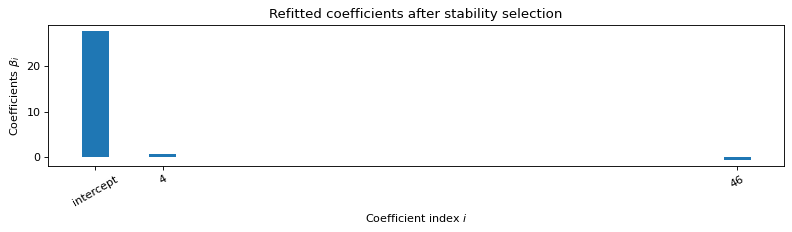

INFO:absl:Setup matrices...



 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.002s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.046s

True Beta: [ 0.     0.     0.     0.     0.393  0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.257  0.
  0.494  0.    -0.09  -0.125  0.     0.    -0.188  0.     0.     0.
  0.113  0.     0.     0.    -0.252  0.     0.     0.     0.     0.
  0.     0.    -0.255  0.     0.7    0.    -0.533]
Estimated Beta: [ 0.    0.    0.   -0.55  0.11  0.09  0.08  0.07  0.06  0.06  0.05  0.05
  0.05  0.04  0.04  0.04  0.04  0.03  0.03  0.03  0.03  0.03  0.03  0.03
  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02  0.02
  0.02  0.02  0.02  0.02  0.01  0.01  0.01  0.01  0.01  0.62]
Error: 4.79

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>

INFO:absl:Optimize lambda...
INFO:absl:KIV1 minimization did not succeed.
INFO:absl:Optimal lambda [-10.73574939]...
INFO:absl:Optimize xi...
INFO:absl:KIV2 minimization did not succeed.
INFO:absl:Optimal xi [-2.99573366]...
INFO:absl:Predict treatment effect...


Error: 5.86

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY SECOND STAGE - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 0.04

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV (manual) >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 9.28

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR ILR Regression Implementation >>>>>>>>>>>>>>>>>>>>>>>


/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/regression/linear_model.py:1817: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:              -170785520.074
Model:                         IV2SLS   Adj. R-squared:         -179029102.413
Method:                     Two Stage   F-statistic:                 2.059e-17
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Di, 03 Aug 2021                                         
Time:                        06:25:17                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      -2665.3449   5.66e+10  -4.71e-08      1.0

In [17]:
num_iteration = 20

df_beta, df_mse, mse_large_confidence= run_methods_confidence_interval(
    param.key, num_iteration, 
    param.n, param.p, param.num_inst, param.mu_c, param.c_X, 
    param.alpha0, param.alphaT, param.c_Y, param.beta0, param.betaT, 
    is_nonlinear=False, is_negbinom=True,
    num_star=250, logcontrast_threshold=0.3)

In [18]:
import pickle
results = {
    "df_mse": df_mse,
    "df_beta": df_beta,
    "mse_large": mse_large_confidence
}

with open(os.path.join(os.getcwd(),"temp", "results_real.pickle"), "wb") as f:
    pickle.dump(results, f)
    f.close()

In [19]:
with open(os.path.join(os.getcwd(),"temp", "results_real.pickle"), "rb") as f:
    results = pickle.load(f)
    df_mse = results["df_mse"]
    df_beta = results["df_beta"]
    f.close()

# Generation of final plots


The plots shown in this section are both the short plots in the main part of the paper as well as the more informative plots in the appendix.

Please note, that in the argument of the `filter_list` it is possible to compare different methods in customized order in one plot.

## Out of sample MSE plots

In [20]:
filter_list = ["ALR+LC", "ONLY Second LC", "KIV"]

fig = plot_mse_results(df_mse, filter_list, sort_to_filter=True)
fig.show()

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/pandas/core/generic.py:5170: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [21]:
filter_list = ["ALR+LC", "ILR+LC", "DIR+LC",  "ONLY Second LC", "ONLY Second ILR", "KIV"]

fig = plot_mse_results(df_mse, filter_list, sort_to_filter=True)
fig.update_yaxes(range=(0, 11))
fig.show()

In [22]:
filter_list = ["ALR+LC", "ILR+LC", "DIR+LC", "ILR+ILR", "ONLY Second LC", "ONLY Second ILR", "KIV"]

fig = plot_mse_results(df_mse, filter_list, sort_to_filter=True)
fig.update_yaxes(range=(0, 1000000))
fig.show()

## True $\beta$ vs. estimated $\beta$s.

### Influential $\beta$ values

In [23]:
filter_list = ["ALR+LC", "ILR+LC", "ILR+ILR", "DIR+LC",  "ONLY Second LC", "ONLY Second ILR", "KIV+KIV"]
fig = plot_beta_results(df_beta, param.betaT, filter_list, sort_to_filter=True)
fig.update_layout(showlegend=False)
fig.update_yaxes(range=(-100, 60))
fig.update_layout(width=2000, height=500)
fig.show()

In [24]:
filter_list = ["ALR+LC", "ILR+LC", "ILR+ILR", "DIR+LC",  "ONLY Second LC", "ONLY Second ILR", "KIV+KIV"]
fig = plot_beta_results(df_beta, param.betaT, filter_list, sort_to_filter=True)
fig.update_layout(showlegend=False)
fig.update_yaxes(range=(-1, 1))
fig.update_layout(width=2000, height=500)
fig.show()

### Non-influential $\beta$ values

In [25]:
filter_list = ["ALR+LC", "ILR+LC", "ILR+ILR", "DIR+LC",  "ONLY Second LC", "ONLY Second ILR", "KIV+KIV"]
fig = plot_beta_results(df_beta, param.betaT, filter_list, sort_to_filter=True, beta_zero=True)
fig.update_layout(showlegend=False)
fig.update_yaxes(range=(-1, 1))
fig.update_layout(width=2000, height=500)
fig.show()

In [26]:
fig = plot_beta_results(df_beta, param.betaT, filter_list, beta_zero=True)


fig.update_yaxes(range=(-1, 1))
fig.update_layout(width=2000, height=500)
fig.show()
